In [1]:
import re
import pandas as pd
import numpy as np
import re
import folium
import string
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline
from nltk.probability import FreqDist
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("webscrap.csv")
df.head(12)

,Job Post,Company,Skills,Ratings,Reviews,Experience,Salary,Location,Job_Post_History,URL
0,Site Merchandiser,Mahindra First Choice Wheels Ltd (car&bike),"Banners,Content,google analytics,merchandising...",4.1,(556 Reviews),4-5 Yrs,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-site-merch...
1,Graphic Designer,Mahindra First Choice Wheels Ltd (car&bike),"Video Editing,Illustrator,Adobe After Effects,...",4.1,(556 Reviews),2-5 Yrs,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-graphic-de...
2,Executive Copywriter,Mahindra First Choice Wheels Ltd (car&bike),"Graphics,text images,Content,copy writer,socia...",4.1,(556 Reviews),2-4 Yrs,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-executive-...
3,"Automation Test Engineer Position , Bangalore",Mahindra First Choice,"#Automation Tester,Automation Engineering",4.1,(556 Reviews),3-5 Yrs,"7,00,000 - 10,00,000 PA.",Bangalore/Bengaluru,8 Days Ago,https://www.naukri.com/job-listings-automation...
4,Area Manager - Xmart,Mahindra First Choice,"dealer sales,Channel Sales,Dealer Channel Mana...",4.1,(556 Reviews),3-8 Yrs,Not disclosed,"Ludhiana, Jaipur, Delhi / NCR",30+ Days Ago,https://www.naukri.com/job-listings-area-manag...
5,Area Manager - XMart,Mahindra First Choice,"sales operations,area management,Business Deve...",4.1,(556 Reviews),6-8 Yrs,Not disclosed,"Guwahati, Bhopal, Raipur",30+ Days Ago,https://www.naukri.com/job-listings-area-manag...
6,Software Engineer- BIZAGI Developer,Mahindra First Choice,"MS SQL,Web services,Design development,busines...",4.1,(556 Reviews),3-8 Yrs,Not disclosed,"Chennai, Bengaluru",30+ Days Ago,https://www.naukri.com/job-listings-software-e...
7,Software Engineer/ Senior Software Engineer,Mahindra First Choice,"PHP,OOPS,PHP framework,Laravel,React JS,CSS3,S...",4.1,(556 Reviews),2-6 Yrs,Not disclosed,Bangalore/Bengaluru,25 Days Ago,https://www.naukri.com/job-listings-software-e...
8,Store Manager - Superstore,Mahindra First Choice,"sales,Key Account Management,Business Developm...",4.1,(556 Reviews),8-12 Yrs,Not disclosed,"Nasik/Nashik, Pune",30+ Days Ago,https://www.naukri.com/job-listings-store-mana...
9,Customer Relation Executive,Mahindra First Choice,"Customer Relation Executive,Malayalam,Customer...",4.1,(556 Reviews),0-2 Yrs,Not disclosed,Gurgaon,30+ Days Ago,https://www.naukri.com/job-listings-customer-r...


In [3]:
df.shape

(3816, 10)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3816 entries, 0 to 3815
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Job Post          3816 non-null   object 
 1   Company           3816 non-null   object 
 2   Skills            3816 non-null   object 
 3   Ratings           3816 non-null   float64
 4   Reviews           3816 non-null   object 
 5   Experience        3816 non-null   object 
 6   Salary            3816 non-null   object 
 7   Location          3816 non-null   object 
 8   Job_Post_History  3816 non-null   object 
 9   URL               3816 non-null   object 
dtypes: float64(1), object(9)
memory usage: 298.2+ KB


In [5]:
df.describe()

,Ratings
count,3816.000000
mean,3.878983
std,0.351352
min,1.000000
25%,3.800000
50%,3.900000
75%,4.000000
max,5.000000


In [6]:
df.isnull().sum()

Job Post            0
Company             0
Skills              0
Ratings             0
Reviews             0
Experience          0
Salary              0
Location            0
Job_Post_History    0
URL                 0
dtype: int64

In [7]:
df.columns

Index(['Job Post', 'Company', 'Skills', 'Ratings', 'Reviews', 'Experience',
       'Salary', 'Location', 'Job_Post_History', 'URL'],
      dtype='object')

In [8]:
df.Company.unique()

array(['Mahindra First Choice Wheels Ltd  (car&bike)',
       'Mahindra First Choice Wheels Ltd (car&bike)',
       'Mahindra First Choice Wheels Ltd (car&bike)  ',
       'Mahindra First Choice', 'TATA CONSULTANCY SERVICES (TCS)',
       'Tech Mahindra Business Services',
       'Tech Mahindra Business Services Pvt. Ltd  ', 'Tech Mahindra',
       'Orange Business Services India Technology Pvt Ltd',
       'Escalon Business Services', 'Orange Business Services',
       'Grampro Business Services Pvt Ltd', 'TechStar Group', 'RGBSI',
       'Datrax Services Pvt Ltd', 'First American (India) Pvt Ltd',
       'Verizon', 'NGSL', 'PM AM Corporation', 'Home Bazaar Services',
       'BT Global', 'AXA Business', 'Incubit Global Business Services',
       'ValueMomentum', 'RSAL STEEL PVT LTD.',
       'Dell International Services IndiaPrivate Limited', 'Capgemini',
       'VFI SLK', 'Collabera', 'PwC', 'Mahindra Logistics',
       'Club Mahindra', 'Barclays Shared Services (BSS)', 'Berkadia',
 

In [9]:
df['Job_Post_History'].unique()

array(['1 Day Ago', '8 Days Ago', '30+ Days Ago', '25 Days Ago',
       '20 Days Ago', 'Today', '2 Days Ago', '7 Days Ago', '6 Days Ago',
       '11 Days Ago', '13 Days Ago', '10 Days Ago', '14 Days Ago',
       '24 Days Ago', '12 Days Ago', '15 Days Ago', '16 Days Ago',
       '18 Days Ago', '21 Days Ago', '22 Days Ago', '27 Days Ago',
       'Few Hours Ago', '5 Days Ago', '4 Days Ago', '28 Days Ago',
       '26 Days Ago', '19 Days Ago', '3 Days Ago', 'Just Now',
       '9 Days Ago', '29 Days Ago', '23 Days Ago', '30 Days Ago',
       '17 Days Ago'], dtype=object)

In [10]:
df['Location'].unique()

array(['Mumbai', 'Bangalore/Bengaluru', 'Ludhiana, Jaipur, Delhi / NCR',
       'Guwahati, Bhopal, Raipur', 'Chennai, Bengaluru',
       'Nasik/Nashik, Pune', 'Gurgaon', 'Chennai, Bangalore/Bengaluru',
       'Gurgaon/Gurugram', 'india', 'Bengaluru', 'Pune',
       'Noida, Kolkata, Chennai, Bangalore/Bengaluru, Delhi / NCR, Mumbai (All Areas)',
       'Pan India',
       'Indore, Hyderabad/Secunderabad, Pune, Chennai, Bangalore/Bengaluru, Delhi / NCR, Mumbai (All Areas)',
       'Kolkata, Pune, Chennai, India, Bangalore/Bengaluru, Delhi / NCR, Mumbai (All Areas)',
       'Bangalore/Bengaluru, India',
       'Hyderabad/Secunderabad, Chennai, Bangalore/Bengaluru',
       'Nagpur, Hyderabad/Secunderabad, Bangalore/Bengaluru',
       'Trivandrum/Thiruvananthapuram',
       'Hyderabad/Secunderabad, Bangalore/Bengaluru, Delhi / NCR',
       'Mumbai (All Areas)', 'Kolkata, Mumbai, Ahmedabad', 'Kolkata',
       'Bhubaneswar, Chennai, Bangalore/Bengaluru, Mumbai (All Areas)',
       'Chennai', 

In [11]:
df.Ratings.unique()

array([4.1, 3.9, 3.6, 3.8, 4.3, 4.2, 4. , 3.4, 3.7, 5. , 4.5, 2.9, 2.8,
       3.2, 3.5, 3.3, 2.4, 4.7, 4.9, 3.1, 4.4, 4.6, 2.7, 1. , 1.2, 4.8,
       1.9, 3. , 2.5, 2.1, 2.2, 2.6])

## User Defined Functions

In [12]:
# user defined functions

def MinExp(txt):
    num = int(txt.split('-')[0])
    return num

def MaxExp(txt):
    num = int(txt.split('-')[1])
    return num

def preprocess_location(loc):
    loc=re.split('\(', loc)[0].strip()
    loc=re.sub('New Delhi','Delhi',loc)
    return loc

## Data Cleaning

In [13]:
def clean_text(text):
    text = re.sub('Yrs',' ',str(text))
    text = re.sub('[‘’“”…]', '',str(text))
    text = re.sub(";",',',str(text))
    text = re.sub("[']",'',str(text))
    return text

clean1 = lambda x: clean_text(x)

In [14]:
df['Skills'] = df['Skills'].apply(clean1)
df.head(2)

,Job Post,Company,Skills,Ratings,Reviews,Experience,Salary,Location,Job_Post_History,URL
0,Site Merchandiser,Mahindra First Choice Wheels Ltd (car&bike),"Banners,Content,google analytics,merchandising...",4.1,(556 Reviews),4-5 Yrs,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-site-merch...
1,Graphic Designer,Mahindra First Choice Wheels Ltd (car&bike),"Video Editing,Illustrator,Adobe After Effects,...",4.1,(556 Reviews),2-5 Yrs,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-graphic-de...


In [15]:
print(df.Skills)

0       Banners,Content,google analytics,merchandising...
1       Video Editing,Illustrator,Adobe After Effects,...
2       Graphics,text images,Content,copy writer,socia...
3               #Automation Tester,Automation Engineering
4       dealer sales,Channel Sales,Dealer Channel Mana...
                              ...                        
3811          IT Skills,Oracle,SAP,IT Technical Recruiter
3812    Content Editing,Content Development,Back Offic...
3813    sales,Hospitality,Media Sales,Automobile,Indus...
3814    BPO,Bpo Voice,customer service,bulk hiring,inb...
3815               Onboarding,Payroll,PF,ESIC,Recruitment
Name: Skills, Length: 3816, dtype: object


In [16]:
for x in df['Skills']:
    x.strip("")
    
df['Skills']    

0       Banners,Content,google analytics,merchandising...
1       Video Editing,Illustrator,Adobe After Effects,...
2       Graphics,text images,Content,copy writer,socia...
3               #Automation Tester,Automation Engineering
4       dealer sales,Channel Sales,Dealer Channel Mana...
                              ...                        
3811          IT Skills,Oracle,SAP,IT Technical Recruiter
3812    Content Editing,Content Development,Back Offic...
3813    sales,Hospitality,Media Sales,Automobile,Indus...
3814    BPO,Bpo Voice,customer service,bulk hiring,inb...
3815               Onboarding,Payroll,PF,ESIC,Recruitment
Name: Skills, Length: 3816, dtype: object

In [17]:
df['Experience'] = df['Experience'].apply(clean1)
df.head(2)

,Job Post,Company,Skills,Ratings,Reviews,Experience,Salary,Location,Job_Post_History,URL
0,Site Merchandiser,Mahindra First Choice Wheels Ltd (car&bike),"Banners,Content,google analytics,merchandising...",4.1,(556 Reviews),4-5,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-site-merch...
1,Graphic Designer,Mahindra First Choice Wheels Ltd (car&bike),"Video Editing,Illustrator,Adobe After Effects,...",4.1,(556 Reviews),2-5,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-graphic-de...


In [18]:
df.rename(columns = {'Experience':'Experience(in Yrs)'}, inplace = True)
df.head(2)

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL
0,Site Merchandiser,Mahindra First Choice Wheels Ltd (car&bike),"Banners,Content,google analytics,merchandising...",4.1,(556 Reviews),4-5,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-site-merch...
1,Graphic Designer,Mahindra First Choice Wheels Ltd (car&bike),"Video Editing,Illustrator,Adobe After Effects,...",4.1,(556 Reviews),2-5,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-graphic-de...


In [19]:
def clean_text1(text):
    '''Make text lowercase, remove text in square brackets, remove punctuation and remove words containing numbers.'''
    text = re.sub('[( )]',' ',text)
    text = re.sub('Reviews',' ',text)
    return text

clean2 = lambda x: clean_text1(x)

In [20]:
df['Reviews'] = df['Reviews'].apply(clean2)
df.head(2)

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL
0,Site Merchandiser,Mahindra First Choice Wheels Ltd (car&bike),"Banners,Content,google analytics,merchandising...",4.1,556,4-5,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-site-merch...
1,Graphic Designer,Mahindra First Choice Wheels Ltd (car&bike),"Video Editing,Illustrator,Adobe After Effects,...",4.1,556,2-5,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-graphic-de...


In [21]:
df.Reviews = df.Reviews.astype(int)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3816 entries, 0 to 3815
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Job Post            3816 non-null   object 
 1   Company             3816 non-null   object 
 2   Skills              3816 non-null   object 
 3   Ratings             3816 non-null   float64
 4   Reviews             3816 non-null   int32  
 5   Experience(in Yrs)  3816 non-null   object 
 6   Salary              3816 non-null   object 
 7   Location            3816 non-null   object 
 8   Job_Post_History    3816 non-null   object 
 9   URL                 3816 non-null   object 
dtypes: float64(1), int32(1), object(8)
memory usage: 283.3+ KB


In [22]:
df.describe()

,Ratings,Reviews
count,3816.000000,3816.000000
mean,3.878983,14719.768868
std,0.351352,17635.515010
min,1.000000,2.000000
25%,3.800000,185.000000
50%,3.900000,3584.000000
75%,4.000000,20690.000000
max,5.000000,46198.000000


In [23]:
duplicate = df[df.duplicated()]
duplicate

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL
105,Automation Engineer,TATA CONSULTANCY SERVICES (TCS),"automation engineering,Espresso,XCUITEST,mobil...",3.9,46198,3-8,Not disclosed,"Hyderabad/Secunderabad, Ahmedabad, Chennai",2 Days Ago,https://www.naukri.com/job-listings-automation...
110,Azure Certified Dot Net Developer,TATA CONSULTANCY SERVICES (TCS),"Azure,. Net,analytical,Java NET,REST API,Azure...",3.9,46198,4-9,Not disclosed,"Hyderabad/Secunderabad, Chennai, Bangalore/Ben...",24 Days Ago,https://www.naukri.com/job-listings-azure-cert...
119,Tcs Hiring For DOT NET Developer For PAN India...,TATA CONSULTANCY SERVICES (TCS),".net,bootstrap,jQuery,SQL server,C# Net,Jscrip...",3.9,46198,1-6,Not disclosed,"Kolkata, Hyderabad/Secunderabad, Pune, Ahmedab...",1 Day Ago,https://www.naukri.com/job-listings-tcs-hiring...
120,Plsql Developer,TATA CONSULTANCY SERVICES (TCS),"Unix,PLSQL,IT Skills,Testing",3.9,46198,3-8,Not disclosed,Bangalore/Bengaluru,1 Day Ago,https://www.naukri.com/job-listings-plsql-deve...
121,Azure Certified Dot Net Developer,TATA CONSULTANCY SERVICES (TCS),"Azure,. Net,analytical,Java NET,REST API,Azure...",3.9,46198,4-9,Not disclosed,"Hyderabad/Secunderabad, Chennai, Bangalore/Ben...",24 Days Ago,https://www.naukri.com/job-listings-azure-cert...
...,...,...,...,...,...,...,...,...,...,...
3785,"Technical Lead, Data Quality",Colt Technology Services,"Data Quality,Data Mapping",4.3,334,6-11,Not disclosed,"Gurgaon/Gurugram, Bangalore/Bengaluru",7 Days Ago,https://www.naukri.com/job-listings-technical-...
3786,"Technical Lead, Data Engineer",Colt Technology Services,"Data Engineer,GCP,Google Cloud Platform",4.3,334,4-9,Not disclosed,"Gurgaon/Gurugram, Bangalore/Bengaluru",7 Days Ago,https://www.naukri.com/job-listings-technical-...
3787,Senior Fashion Consultant - Bandra West,eCentric solutions,"Retail Sales,print media,sales,collections,Dig...",3.5,188,2-6,"2,50,000 - 6,00,000 PA.",Mumbai (All Areas)(Bandra Kurla Complex),7 Days Ago,https://www.naukri.com/job-listings-senior-fas...
3788,Territory Manager - Digital Sales,DVARA KSHETRIYA GRAMIN FINANCIAL SERVICES PRIV...,Min 2 - 3 years of Team Handling experience in...,4.0,140,2-6,Not disclosed,Mysore/Mysuru,7 Days Ago,https://www.naukri.com/job-listings-territory-...


In [24]:
df=df.drop_duplicates()
df.shape

(2908, 10)

### A) Univariate Anaysis

#### 1) Job Post

In [25]:
#for r in (('Software Senior Engineer','Senior Software Engineer'),('Software Engineer 2','Software Engineer'),('Software Engineer II','Software Engineer'),('Azure Data Engineer','Data Engineer')):
   # df['Job Post'] = df['Job Post'].replace(*r)

In [26]:
# top jobs
job_all=df['Job Post'].value_counts().rename_axis('Job Post').reset_index(name='Count')
job_all.style.background_gradient(cmap='mako_r')

,Job Post,Count
0,Java Developer,20
1,Senior Software Engineer,19
2,Java Full Stack Developer,16
3,Software Engineer,16
4,Software Principal Engineer,16
5,Software Senior Engineer,11
6,Dot Net Developer,10
7,Customer Service Executive,9
8,Senior Technical Consultant,9
9,Azure Data Engineer,9


In [27]:
job_all.count()

Job Post    2434
Count       2434
dtype: int64

In [28]:
job_all['Job Post'].nunique()

2434

In [29]:
# top 10 jobs
job_10=df['Job Post'].value_counts()[:10].rename_axis('Job Post').reset_index(name='Count')
job_10.style.background_gradient(cmap='mako_r')

,Job Post,Count
0,Java Developer,20
1,Senior Software Engineer,19
2,Java Full Stack Developer,16
3,Software Engineer,16
4,Software Principal Engineer,16
5,Software Senior Engineer,11
6,Dot Net Developer,10
7,Customer Service Executive,9
8,Senior Technical Consultant,9
9,Azure Data Engineer,9


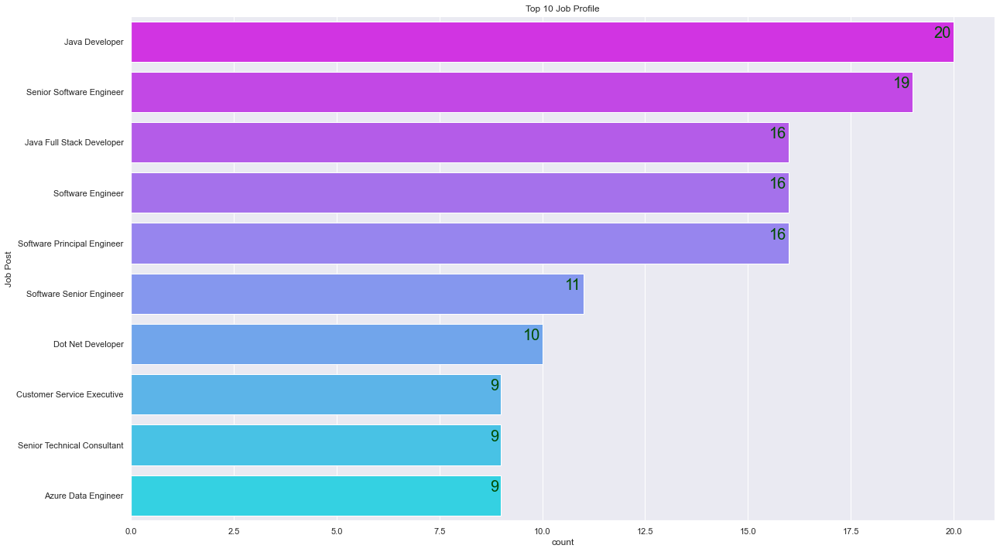

In [30]:
plt.figure(figsize = (20, 12))
sns.set(style = "darkgrid")
ax = sns.countplot(y = 'Job Post', data = df, palette=("cool_r"),
              order = df['Job Post'].value_counts().iloc[:10].index)
for p in ax.patches:
    ax.annotate(int(p.get_width()), ((p.get_x() + p.get_width()), p.get_y()), xytext = (-3, -21),
                fontsize = 20, color = '#004d00', textcoords = 'offset points', horizontalalignment = 'right')
plt.title('Top 10 Job Profile')
plt.show()

#### 2) Company

In [31]:
# number of companies available
df['Company'].nunique()

460

In [32]:
df['Company'].unique()

array(['Mahindra First Choice Wheels Ltd  (car&bike)',
       'Mahindra First Choice Wheels Ltd (car&bike)',
       'Mahindra First Choice Wheels Ltd (car&bike)  ',
       'Mahindra First Choice', 'TATA CONSULTANCY SERVICES (TCS)',
       'Tech Mahindra Business Services',
       'Tech Mahindra Business Services Pvt. Ltd  ', 'Tech Mahindra',
       'Orange Business Services India Technology Pvt Ltd',
       'Escalon Business Services', 'Orange Business Services',
       'Grampro Business Services Pvt Ltd', 'TechStar Group', 'RGBSI',
       'Datrax Services Pvt Ltd', 'First American (India) Pvt Ltd',
       'Verizon', 'NGSL', 'PM AM Corporation', 'Home Bazaar Services',
       'BT Global', 'AXA Business', 'Incubit Global Business Services',
       'ValueMomentum', 'RSAL STEEL PVT LTD.',
       'Dell International Services IndiaPrivate Limited', 'Capgemini',
       'VFI SLK', 'Collabera', 'PwC', 'Mahindra Logistics',
       'Club Mahindra', 'Barclays Shared Services (BSS)', 'Berkadia',
 

In [33]:
for r in (('Mahindra First Choice Wheels Ltd  (car&bike)','Mahindra First Choice Wheels Ltd (car&bike)'),('Mahindra First Choice Wheels Ltd (car&bike)  ','Mahindra First Choice Wheels Ltd (car&bike)'),('Mahindra First Choice','Mahindra First Choice Wheels Ltd (car&bike)'),('Tech Mahindra Business Services Pvt. Ltd  ','Tech Mahindra Business Services Pvt. Ltd'),('Tech Mahindra Business Services','Tech Mahindra Business Services Pvt. Ltd')):
    df['Company'] = df['Company'].replace(*r)

In [34]:
# companies
df_company_all=df['Company'].value_counts().rename_axis('Company').reset_index(name='Job Openings')
df_company_all.style.background_gradient(cmap='binary')

,Company,Job Openings
0,TATA CONSULTANCY SERVICES (TCS),507
1,Tech Mahindra,472
2,Capgemini,104
3,Dun & Bradstreet,97
4,Orange Business Services,86
5,Amazon Web Services (AWS),68
6,Teleperformance (TP),56
7,Tech Mahindra Business Services Pvt. Ltd,52
8,Dell International Services IndiaPrivate Limited,52
9,Harman Connected Services Corporation India Pvt.,45


In [35]:
#x1 = df_company_all['Company'].where(df_company_all['Job Openings']>=20).dropna()
#print(x1)

In [36]:
# top 10 companies
df_company=df['Company'].value_counts()[:10].rename_axis('Company').reset_index(name='Job Openings')
df_company.style.background_gradient(cmap='binary')

,Company,Job Openings
0,TATA CONSULTANCY SERVICES (TCS),507
1,Tech Mahindra,472
2,Capgemini,104
3,Dun & Bradstreet,97
4,Orange Business Services,86
5,Amazon Web Services (AWS),68
6,Teleperformance (TP),56
7,Tech Mahindra Business Services Pvt. Ltd,52
8,Dell International Services IndiaPrivate Limited,52
9,Harman Connected Services Corporation India Pvt.,45


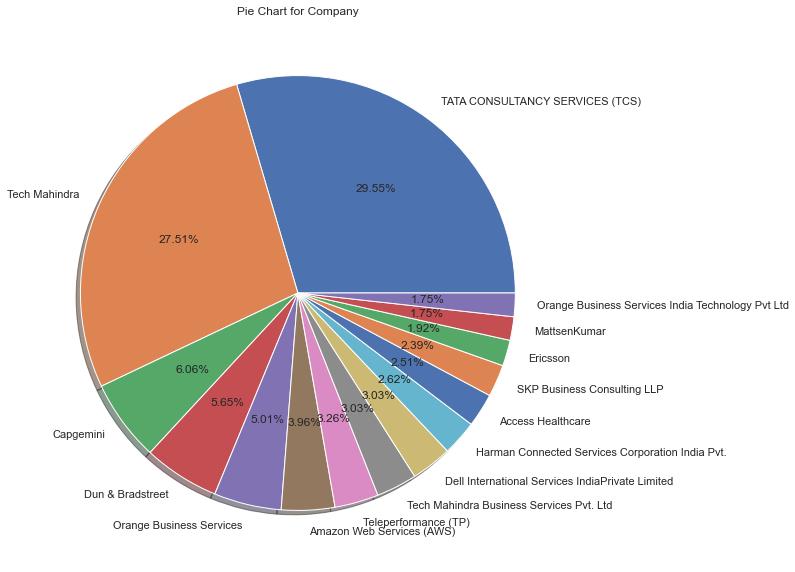

In [37]:
plt.figure(figsize=(18,10))
#myexplode = [0.2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0]
plt.pie(df['Company'].value_counts()[:15],labels =df['Company'].value_counts()[:15].index, startangle = 360, shadow = True, autopct='%1.2f%%')
plt.title("Pie Chart for Company")
plt.show()

#### 3) Skills

In [38]:
skills=[j.lower() for i in df['Skills'] for j in i.split(',')]
len(skills)

19505

In [39]:
print(skills)

['banners', 'content', 'google analytics', 'merchandising', 'designing', 'video editing', 'illustrator', 'adobe after effects', 'photoshop', 'indesign', 'graphics', 'text images', 'content', 'copy writer', 'social media', 'banners', '#automation tester', 'automation engineering', 'dealer sales', 'channel sales', 'dealer channel management', 'dealer development', 'sales operations', 'area management', 'business development', 'dealer network', 'ms sql', 'web services', 'design development', 'business rules', 'deployment', 'mentor', 'subject matter expert', 'virtualization', 'php', 'oops', 'php framework', 'laravel', 'react js', 'css3', 'sql', 'rest api', 'sales', 'key account management', 'business development', 'vehicles procurement', 'customer relation executive', 'malayalam', 'customer service', 'product management', 'sales', 'retail sales', 'showroom sales', 'automobile', 'sales', 'process improvement', 'network expansion', 'management', 'business operations', 'front end', 'symfony',

In [40]:
# Top 10 demanding skills in data science jobs
skills=[j.lower() for i in df['Skills'] for j in i.split(',')]
fdist = FreqDist(skills)
skill_df=pd.DataFrame(fdist.items(), 
                      columns=['Skill', 'Frequency']
                    ).sort_values('Frequency', ascending=False)[0:10]
skill_df.style.background_gradient()

,Skill,Frequency
65,it skills,499
184,bpo,424
95,java,264
45,customer service,249
108,python,245
217,voice,203
38,sql,157
78,cloud,153
251,communication,141
198,customer support,140


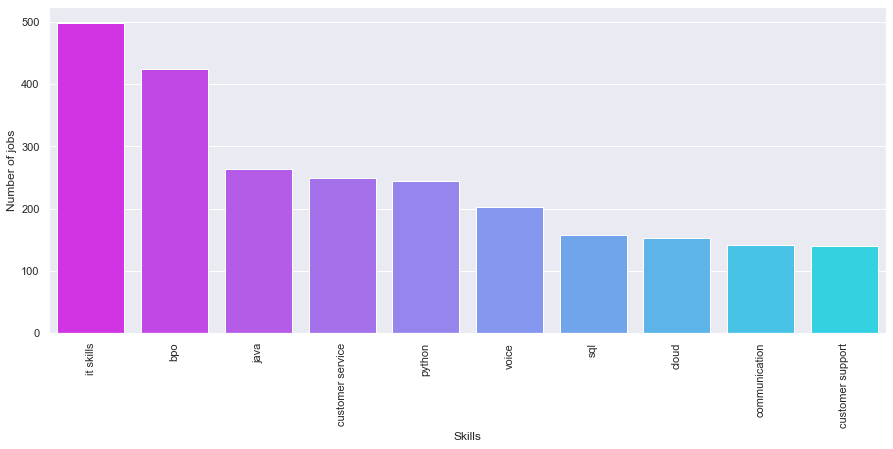

In [41]:
plt.figure(figsize = (15,6))
sns.barplot(x= 'Skill',y= 'Frequency', data= skill_df, palette=("cool_r"))
plt.xticks(rotation=90)
plt.xlabel('Skills')
plt.ylabel('Number of jobs')
plt.show()

In [42]:
skill_df.iloc[0]

Skill        it skills
Frequency          499
Name: 65, dtype: object

In [43]:
#plt.figure(figsize = (20, 12))
# plot

default_color = "grey"
colors = {"it skills": "crimson"}

color_discrete_map = {
    c: colors.get(c, default_color) 
    for c in skill_df.Skill.unique()}

fig = px.bar(skill_df, x='Frequency', y='Skill',color='Skill',orientation='h',color_discrete_map=color_discrete_map)
fig.update_layout(autosize=True,title_text='Top 10 Skills',title_x=0.5)
    #width=900,
    #height=600)

fig.show()

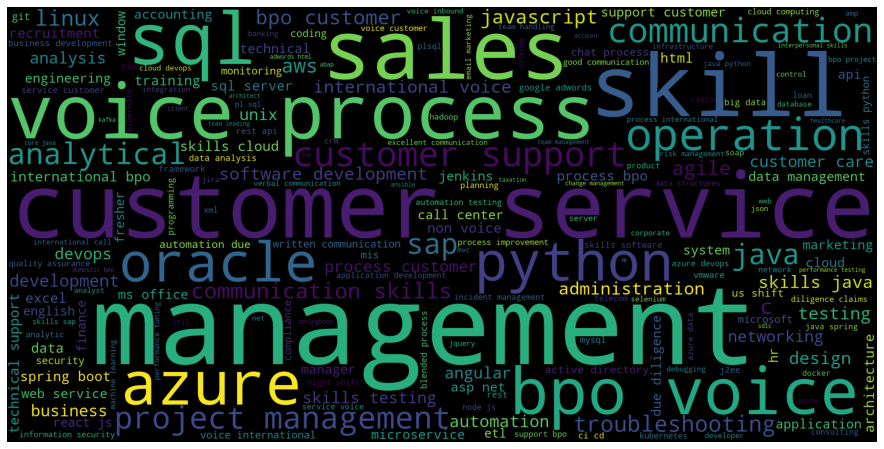

In [44]:
from wordcloud import WordCloud

skills = df['Skills'].to_list()
skills = [str(s) for s in skills]
skills = [s.strip().lower()  for i in skills for s in i.split("|")]
skills = " ".join(w for w in skills)
wc = WordCloud(width = 2000, height = 1000).generate(skills)
plt.figure(figsize = (16, 8))
plt.imshow(wc)
plt.axis('off')
plt.show()

#### 4) Ratings

In [45]:
z = df['Ratings'].value_counts().iloc[:10]
z

3.9    931
3.8    548
4.3    239
3.6    231
4.2    224
4.1    178
4.0    125
3.7     81
3.2     75
3.5     56
Name: Ratings, dtype: int64

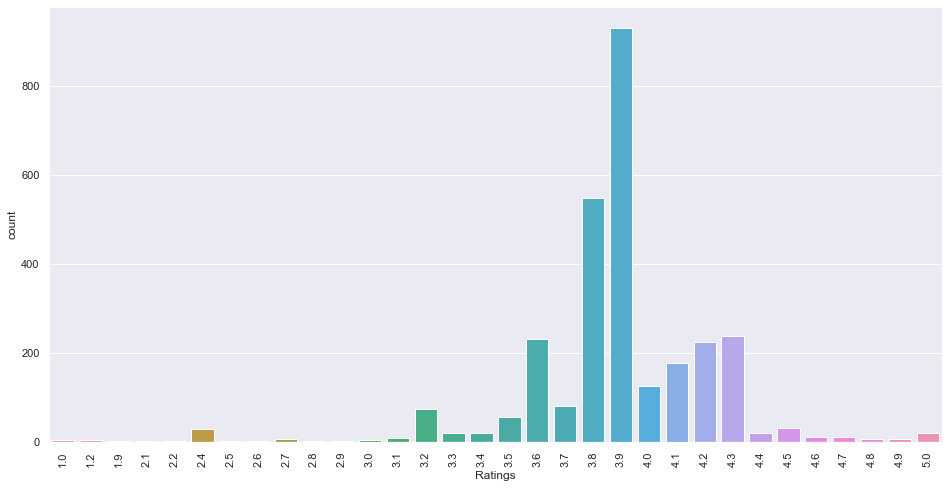

In [46]:
plt.figure(figsize=(16,8))
sns.countplot('Ratings',data=df)
plt.xticks(rotation=90)
plt.show()

array([[<AxesSubplot:title={'center':'Ratings'}>]], dtype=object)

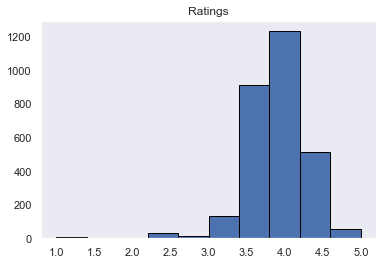

In [47]:
df.hist(column='Ratings', grid=False, edgecolor='black')

<AxesSubplot:>

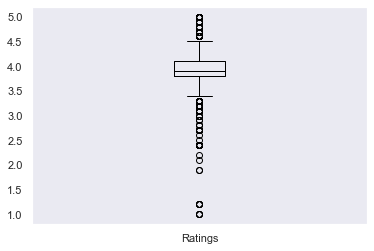

In [48]:
df.boxplot(column=['Ratings'], grid=False, color='black')

#### 5) Reviews

In [49]:
display(df['Reviews'].value_counts())
pd.set_option('display.max_rows', 500)

46198    507
20690    472
891      116
22733    104
185       97
        ... 
362        1
341        1
1016       1
100        1
114        1
Name: Reviews, Length: 250, dtype: int64

array([[<AxesSubplot:title={'center':'Reviews'}>]], dtype=object)

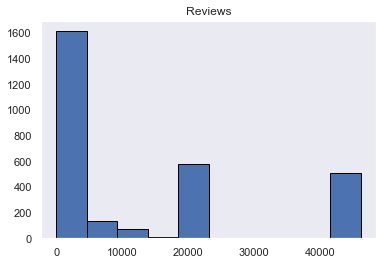

In [50]:
df.hist(column='Reviews', grid=False, edgecolor='black')

<AxesSubplot:>

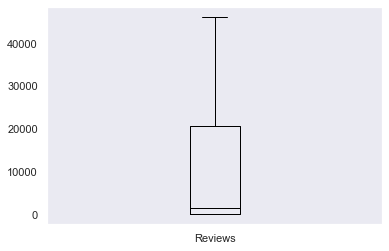

In [51]:
df.boxplot(column=['Reviews'], grid=False, color='black')

#### 6) Experience

In [52]:
# top 10 values in 'Job Experience'
display(df['Experience(in Yrs)'].value_counts())
pd.set_option('display.max_rows', 500)

5-10                              209
3-8                               204
4-9                               178
0-5                               118
1-6                               108
2-5                                99
2-7                                99
3-5                                85
4-8                                84
5-8                                82
3-7                                73
0-3                                72
4-6                                71
7-12                               69
0-1                                67
3-6                                67
2-4                                66
1-4                                60
1-3                                60
2-6                                58
1-5                                54
8-13                               53
8-12                               52
0-2                                52
6-11                               49
0-4                                43
10-15       

In [53]:
import re #regular expression
import string

def clean_text(text):
    text = re.sub('\d+\s\w+ - \d+\s\w+','Nan', text)
    text = re.sub('\d+\s\w+','Nan',text)
    text = re.sub('\w+\s\w+,\s\w+\s\w+','Nan',text)
    return text

clean3 = lambda x: clean_text(x)

In [54]:
df['Experience(in Yrs)'] = df['Experience(in Yrs)'].apply(clean3)

In [55]:
display(df['Experience(in Yrs)'].value_counts())
pd.set_option('display.max_rows', 500)

5-10       209
3-8        204
4-9        178
0-5        118
1-6        108
2-7         99
2-5         99
3-5         85
4-8         84
5-8         82
3-7         73
0-3         72
4-6         71
7-12        69
0-1         67
3-6         67
2-4         66
1-4         60
1-3         60
2-6         58
Nan         57
1-5         54
8-13        53
0-2         52
8-12        52
6-11        49
0-4         43
10-15       41
4-7         38
6-8         38
6-10        38
1-2         36
5-7         36
6-9         32
5-9         29
8-10        29
10-20       27
7-10        26
3-4         19
15-20       18
9-12        16
0-0         16
9-14        16
2-3         16
12-15       12
7-11        11
15-24        9
10-12        9
10-14        7
1-1          7
4-5          6
10-18        6
12-20        6
5-6          6
12-16        5
8-9          4
7-9          4
10-13        3
10-17        3
4-10         2
5-11         2
6-12         2
13-20        2
13-17        2
7-8          2
14-24        2
12-22     

In [56]:
df['Experience(in Yrs)'] = df['Experience(in Yrs)'].replace('Nan','0-5')

In [57]:
display(df['Experience(in Yrs)'].value_counts())
pd.set_option('display.max_rows', 500)

5-10       209
3-8        204
4-9        178
0-5        118
1-6        108
2-7         99
2-5         99
3-5         85
4-8         84
5-8         82
3-7         73
0-3         72
4-6         71
7-12        69
0-1         67
3-6         67
2-4         66
1-4         60
1-3         60
2-6         58
0-5         57
1-5         54
8-13        53
0-2         52
8-12        52
6-11        49
0-4         43
10-15       41
4-7         38
6-8         38
6-10        38
1-2         36
5-7         36
6-9         32
5-9         29
8-10        29
10-20       27
7-10        26
3-4         19
15-20       18
9-12        16
0-0         16
9-14        16
2-3         16
12-15       12
7-11        11
15-24        9
10-12        9
10-14        7
1-1          7
4-5          6
10-18        6
12-20        6
5-6          6
12-16        5
8-9          4
7-9          4
10-13        3
10-17        3
4-10         2
5-11         2
6-12         2
13-20        2
13-17        2
7-8          2
14-24        2
12-22     

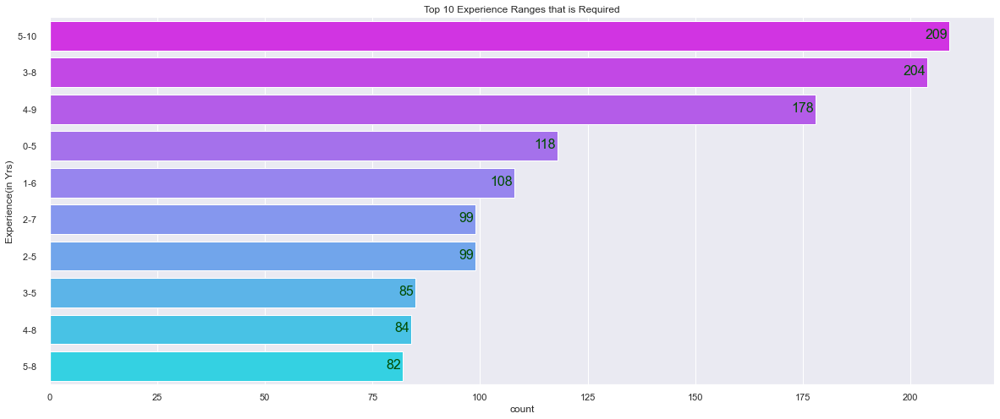

In [58]:
plt.figure(figsize = (20, 8))
sns.set(style = "darkgrid")
ax = sns.countplot(y = 'Experience(in Yrs)', data = df, palette= ("cool_r"),
              order = df['Experience(in Yrs)'].value_counts().iloc[:10].index)
for p in ax.patches:
    ax.annotate(int(p.get_width()), ((p.get_x() + p.get_width()), p.get_y()), xytext = (-2, -20),
                fontsize = 16, color = '#004d00', textcoords = 'offset points', horizontalalignment = 'right')
plt.title('Top 10 Experience Ranges that is Required')
plt.show()

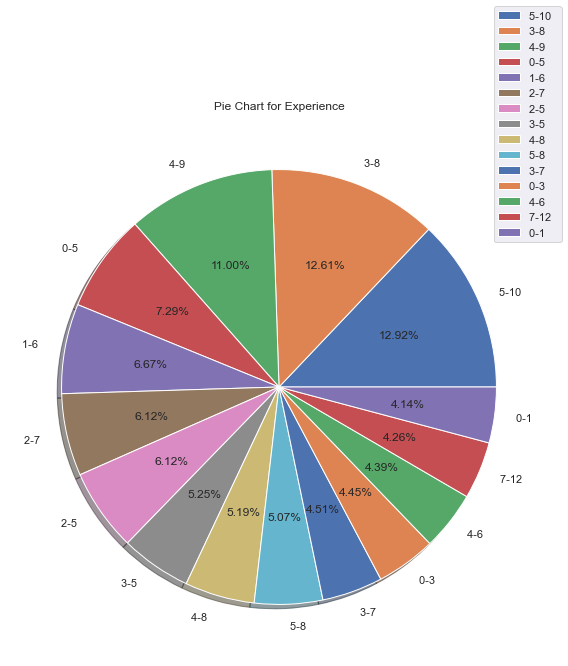

In [59]:
plt.figure(figsize=(18,10))
#myexplode = [0, 0, 0, 0, 0, 0.2, 0, 0, 0, 0, 0,0,0,0]
plt.pie(df['Experience(in Yrs)'].value_counts()[:15],labels =df['Experience(in Yrs)'].value_counts()[:15].index,  startangle = 360, shadow = True, autopct='%1.2f%%')
plt.legend(bbox_to_anchor=(1.02, 1.2),loc='upper right', borderaxespad=0)
plt.title("Pie Chart for Experience")
plt.show()

#### 7) Salary

In [60]:
df['Salary'].value_counts()

Not disclosed                                            1953
3,00,000 - 5,00,000 PA.                                    24
50,000 - 3,00,000 PA.                                      22
2,00,000 - 3,50,000 PA.                                    21
5,00,000 - 15,00,000 PA.                                   19
10,00,000 - 20,00,000 PA.                                  16
3,00,000 - 4,00,000 PA.                                    15
4,00,000 - 9,00,000 PA.                                    14
2,00,000 - 3,00,000 PA.                                    13
1,75,000 - 2,25,000 PA.                                    13
2,00,000 - 2,50,000 PA.                                    13
50,000 - 2,50,000 PA.                                      12
2,00,000 - 4,00,000 PA.                                    12
3,00,000 - 8,00,000 PA.                                    12
15,00,000 - 30,00,000 PA.                                  11
2,50,000 - 3,50,000 PA.                                    11
2,00,000

In [61]:
df['Salary'].unique()

array(['Not disclosed', '7,00,000 - 10,00,000 PA.',
       '13,00,000 - 20,00,000 PA.', '5,00,000 - 15,00,000 PA.',
       '12,00,000 - 20,00,000 PA.', '2,00,000 - 7,00,000 PA.',
       '7,00,000 - 8,00,000 PA.', '3,00,000 - 4,00,000 PA.',
       '3,00,000 - 5,00,000 PA.', '2,00,000 - 2,75,000 PA.',
       '2,25,000 - 4,00,000 PA.', '2,25,000 - 4,75,000 PA.',
       '2,25,000 - 4,50,000 PA.', '2,25,000 - 6,00,000 PA.',
       '2,25,000 - 5,50,000 PA.', '3,75,000 - 5,50,000 PA.',
       '2,75,000 - 5,50,000 PA.', '4,00,000 - 9,00,000 PA.',
       '5,00,000 - 14,00,000 PA.', '3,50,000 - 8,50,000 PA.',
       '25,00,000 - 40,00,000 PA.', '15,00,000 - 25,00,000 PA.',
       '7,50,000 - 17,50,000 PA.', '9,00,000 - 19,00,000 PA.',
       '3,00,000 - 7,00,000 PA.', '15,00,000 - 30,00,000 PA.',
       '8,00,000 - 18,00,000 PA.', '1,50,000 - 3,00,000 PA.',
       '10,00,000 - 20,00,000 PA.', '60,00,000 - 95,00,000 PA.',
       '10,00,000 - 17,00,000 PA.', '10,00,000 - 16,00,000 PA.',
       '50

In [62]:
df['Salary'].nunique()

279

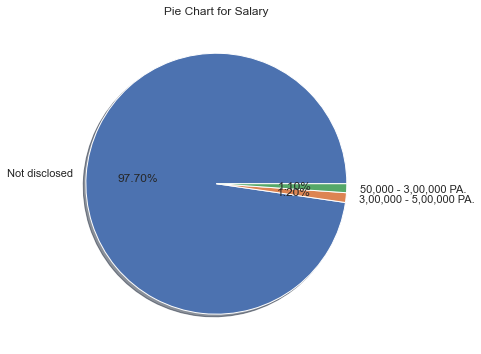

In [63]:
plt.figure(figsize=(10,6))
plt.pie(df['Salary'].value_counts()[:3],labels = df['Salary'].value_counts()[:3].index, startangle = 360, shadow = True, autopct='%1.2f%%')
#plt.legend(bbox_to_anchor=(1.02, 1),loc='upper right', borderaxespad=0)
plt.title("Pie Chart for Salary")
plt.show()

#### 8) Location

In [64]:
# values in location column
df['Location'][:10]

0                           Mumbai
1                           Mumbai
2                           Mumbai
3              Bangalore/Bengaluru
4    Ludhiana, Jaipur, Delhi / NCR
5         Guwahati, Bhopal, Raipur
6               Chennai, Bengaluru
7              Bangalore/Bengaluru
8               Nasik/Nashik, Pune
9                          Gurgaon
Name: Location, dtype: object

In [65]:
## top 10 job locations

# splitting values and saving into a list
loc=df['Location'].tolist()
loc=[j.strip() for i in [j.strip() for i in loc for j in i.split(',')] for j in i.split('/')]

# count
fdist = FreqDist(loc)
loc_df=pd.DataFrame(list(dict(fdist).items()), columns=['location', 'job openings'])

# removing alternate names
for loc in ['Bengaluru','Secunderabad','Cochin','NCR','Gurugram']:
    loc_df=loc_df[loc_df['location']!=loc]
    
# applying function
loc_df['location']=loc_df['location'].apply(preprocess_location)
loc_df=loc_df.groupby('location').sum().reset_index(level=0)

# top 10 locations
loc_df=loc_df.sort_values(by='job openings',ascending=False)[:10]
loc_df.style.background_gradient(cmap='mako_r')

,location,job openings
23,Bangalore,902
89,Hyderabad,623
133,Mumbai,547
165,Pune,508
44,Chennai,507
52,Delhi,333
73,Gurgaon,275
147,Noida,208
115,Kolkata,205
3,Ahmedabad,128


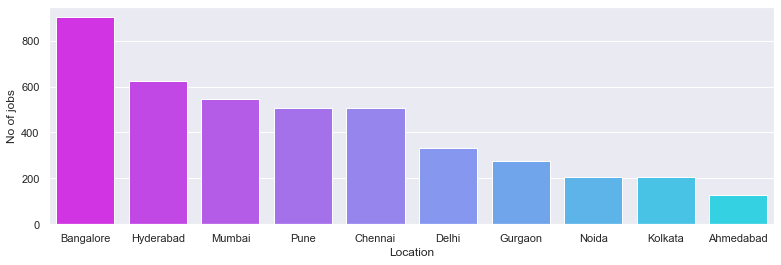

In [66]:
plt.figure(figsize = (13,4))
sns.barplot(x= 'location',y= 'job openings', data=loc_df, palette=("cool_r") )
plt.xlabel('Location')
plt.ylabel('No of jobs')
plt.show()

In [67]:
# latitude and longitude of the locations
lat=[12.9716,17.3850,19.0760,18.5204,13.0827,28.7041,28.4595,28.5355,22.5726,23.0225]
lon=[77.5946,78.4867,72.8777,73.8567,80.2707,77.1025,77.0266,77.3910,88.3639,72.5714]

df1=loc_df.copy()
df1['lat']=lat
df1['lon']=lon

# title
loc = 'Top 10 Job Locations'
title_html = '''
             <h3 align="center" style="font-size:20px"><b>{}</b></h3>
             '''.format(loc)

# creating map
m = folium.Map(location=[20,78], tiles="OpenStreetMap", zoom_start=4.5)
m.get_root().html.add_child(folium.Element(title_html))
    
for i in range(0,len(df1)):
    # marking each location
    folium.Marker(
      location=[df1.iloc[i]['lat'], df1.iloc[i]['lon']],
      popup=df1.iloc[i]['location'],
      tooltip = df1.location.values[i],
      icon=folium.Icon(icon='info-sign', color="red"),
      draggable=False
   ).add_to(m)

# Show the map
m

#### 9) Job_post_History

In [68]:
df['Job_Post_History'].value_counts()

1 Day Ago        460
7 Days Ago       280
6 Days Ago       258
30+ Days Ago     214
4 Days Ago       162
12 Days Ago      147
5 Days Ago       144
14 Days Ago      121
Today            116
13 Days Ago      112
11 Days Ago      102
Few Hours Ago     81
21 Days Ago       66
29 Days Ago       65
28 Days Ago       62
26 Days Ago       59
8 Days Ago        53
3 Days Ago        51
27 Days Ago       46
10 Days Ago       42
20 Days Ago       36
25 Days Ago       33
2 Days Ago        31
18 Days Ago       30
22 Days Ago       30
15 Days Ago       23
19 Days Ago       21
Just Now          18
24 Days Ago       15
9 Days Ago        10
30 Days Ago        6
23 Days Ago        5
17 Days Ago        5
16 Days Ago        4
Name: Job_Post_History, dtype: int64

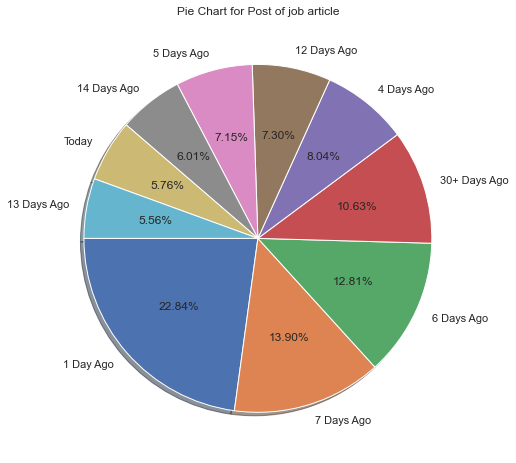

In [69]:
plt.figure(figsize=(15,8))
plt.pie(df['Job_Post_History'].value_counts()[:10],labels = df['Job_Post_History'].value_counts()[:10].index, startangle = 180, shadow = True, autopct='%1.2f%%')
plt.title("Pie Chart for Post of job article")
plt.show()

### B) Bivariat Analysis

#### 1) Ratings Vs Reviews

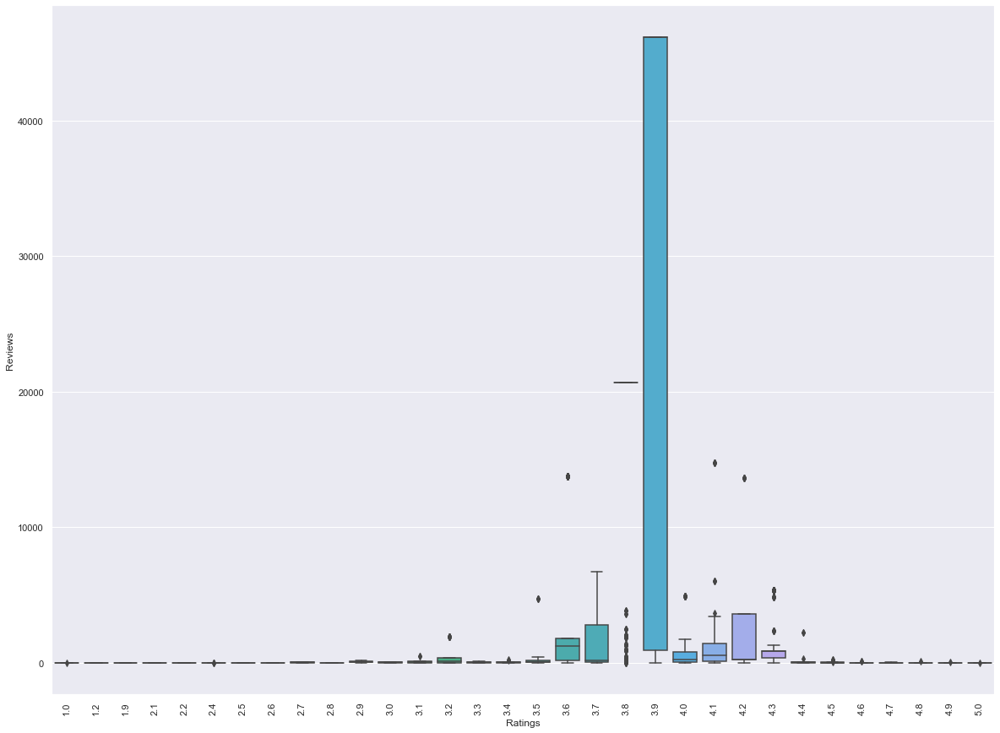

In [70]:
plt.figure(figsize=(20,15))
sns.boxplot(x="Ratings",y="Reviews",orient="v",data=df)
plt.xticks(rotation=90)
plt.show()

#### 2) Job Post Vs Skills

In [71]:
# plot
dataframe1 = pd.DataFrame()

for job in job_10['Job Post']:
    df1 = df[df['Job Post']==job]
    skill = [skill.lower() for skills in df1['Skills'] for skill in skills.split(',') if skill != 'IT Skills']
    fdist = FreqDist(skill)
    fdist_df=pd.DataFrame(list(dict(fdist).items()), columns=['skill', 'count'])
    fdist_df= fdist_df.sort_values(by='count', ascending=False)[:10]
    fdist_df = fdist_df.assign(job=job)
    dataframe1=dataframe1.append(fdist_df)
    
# Creating sunburst chart
fig = px.sunburst(dataframe1,
                  path=['job', 'skill'],
                  values='count'
                 )

fig.update_layout(
    autosize=False,
    title_text='Top Jobs and the Required Skills',
    title_x=0.5,
    width=1080,
    height=720)

# Display the figure
fig.show()

In [72]:
dataframe1

,skill,count,job
0,java,18,Java Developer
7,spring boot,9,Java Developer
10,hibernate,7,Java Developer
16,spring,6,Java Developer
11,microservices,6,Java Developer
3,javascript,5,Java Developer
13,j2ee,3,Java Developer
22,springboot,2,Java Developer
45,agile,2,Java Developer
1,react,2,Java Developer


#### 3) Company Vs Location

In [73]:
## top 10 job locations

# splitting values and saving into a list
loc1=df['Location'].tolist()
loc1=[j.strip() for i in [j.strip() for i in loc1 for j in i.split(',')] for j in i.split('/')]

# count
fdist = FreqDist(loc1)
loc1_df=pd.DataFrame(list(dict(fdist).items()), columns=['location', 'job openings'])

# removing alternate names
for loc1 in ['Bengaluru','Secunderabad','Cochin','NCR','Gurugram']:
    loc1_df=loc1_df[loc1_df['location']!=loc1]
    
# applying function
loc1_df['location']=loc1_df['location'].apply(preprocess_location)
loc1_df=loc1_df.groupby('location').sum().reset_index(level=0)

loc1_df=loc1_df.sort_values(by='job openings',ascending=False)
loc1_df.style.background_gradient(cmap='mako_r')

,location,job openings
23,Bangalore,902
89,Hyderabad,623
133,Mumbai,547
165,Pune,508
44,Chennai,507
52,Delhi,333
73,Gurgaon,275
147,Noida,208
115,Kolkata,205
3,Ahmedabad,128


In [212]:
# plot
dataframe2 = pd.DataFrame()

for company in df_company['Company']:
    df1 = df[df['Company']==company]
    location = [location.lower() for locations in df1['Location'] for location in locations.split(',') if skill != 'IT Skills']
    fdist = FreqDist(location)
    fdist_df=pd.DataFrame(list(dict(fdist).items()), columns=['location', 'count'])
    fdist_df= fdist_df.sort_values(by='count', ascending=False)[:10]
    fdist_df = fdist_df.assign(company=company)
    dataframe2=dataframe2.append(fdist_df)
    
# Creating sunburst chart
fig = px.sunburst(dataframe2,
                  path=['company', 'location'],
                  values='count'
                 )

fig.update_layout(
    autosize=False,
    title_text='Top Jobs and the corresponding Locations',
    title_x=0.5,
    width=1080,
    height=720)

# Display the figure
fig.show()

In [75]:
dataframe2

,location,count,company
5,bangalore/bengaluru,244,TATA CONSULTANCY SERVICES (TCS)
4,chennai,199,TATA CONSULTANCY SERVICES (TCS)
7,mumbai (all areas),154,TATA CONSULTANCY SERVICES (TCS)
11,pune,130,TATA CONSULTANCY SERVICES (TCS)
6,delhi / ncr,115,TATA CONSULTANCY SERVICES (TCS)
12,kolkata,111,TATA CONSULTANCY SERVICES (TCS)
10,hyderabad/secunderabad,107,TATA CONSULTANCY SERVICES (TCS)
14,hyderabad/secunderabad,107,TATA CONSULTANCY SERVICES (TCS)
19,ahmedabad,72,TATA CONSULTANCY SERVICES (TCS)
21,chennai,47,TATA CONSULTANCY SERVICES (TCS)


#### 4) Company Vs Skills

In [76]:
# plot
dataframe3 = pd.DataFrame()

for company in df_company['Company']:
    df1 = df[df['Company']==company]
    skill = [skill.lower() for skills in df1['Skills'] for skill in skills.split(',') if skill != 'IT Skills']
    fdist = FreqDist(skill)
    fdist_df=pd.DataFrame(list(dict(fdist).items()), columns=['skill', 'count'])
    fdist_df= fdist_df.sort_values(by='count', ascending=False)[:10]
    fdist_df = fdist_df.assign(company=company)
    dataframe3=dataframe3.append(fdist_df)
    
# Creating sunburst chart
fig = px.sunburst(dataframe3,
                  path=['company', 'skill'],
                  values='count'
                 )

fig.update_layout(
    autosize=False,
    title_text='Top Companies and the Required Skills',
    title_x=0.5,
    width=1080,
    height=720)

# Display the figure
fig.show()

In [77]:
dataframe3

,skill,count,company
32,java,100,TATA CONSULTANCY SERVICES (TCS)
45,python,64,TATA CONSULTANCY SERVICES (TCS)
3,azure,44,TATA CONSULTANCY SERVICES (TCS)
37,devops,44,TATA CONSULTANCY SERVICES (TCS)
48,sql,41,TATA CONSULTANCY SERVICES (TCS)
13,cloud,37,TATA CONSULTANCY SERVICES (TCS)
135,oracle,34,TATA CONSULTANCY SERVICES (TCS)
1,aws,34,TATA CONSULTANCY SERVICES (TCS)
154,microservices,32,TATA CONSULTANCY SERVICES (TCS)
143,communication,32,TATA CONSULTANCY SERVICES (TCS)


#### 5) Job Provider(Company) Vs Job Post

In [78]:
## Companies and Jobs

dataframe4 = pd.DataFrame()

for company in df_company['Company']:
    df1 = df[df['Company']==company]
    jobs = [job for job in df1['Job Post']]
    fdist = FreqDist(jobs)
    fdist_df=pd.DataFrame(list(dict(fdist).items()), columns=['jobs', 'count'])
    fdist_df= fdist_df.sort_values(by='count', ascending=False)[:5]
    fdist_df = fdist_df.assign(company=company)
    dataframe4=dataframe4.append(fdist_df)
    
#dataframe.head()
    
# Creating sunburst chart
fig = px.sunburst(dataframe4,
                  path=['company', 'jobs'])

fig.update_layout(
    autosize=False,
    title_text='Top Job Providers and Jobs',
    title_x=0.5,
    width=1000,
    height=720)

# Display the figure
fig.show()

In [79]:
dataframe4

,jobs,count,company
136,Java Developer,14,TATA CONSULTANCY SERVICES (TCS)
57,Java Full Stack Developer,9,TATA CONSULTANCY SERVICES (TCS)
236,React JS Developer,5,TATA CONSULTANCY SERVICES (TCS)
3,Dot Net Developer,5,TATA CONSULTANCY SERVICES (TCS)
146,Java Spring Boot Developer,3,TATA CONSULTANCY SERVICES (TCS)
36,Customer Support Executive,6,Tech Mahindra
2,International Voice Process Executive,4,Tech Mahindra
74,Customer Service Executive,4,Tech Mahindra
274,Associate Customer Support,4,Tech Mahindra
89,Tech Mahindra Hiring For Voice Process - Custo...,2,Tech Mahindra


#### 6) With Experience

In [80]:
# new features
df['Min. Exp.'] = df['Experience(in Yrs)'].apply(MinExp)
df['Max. Exp.'] = df['Experience(in Yrs)'].apply(MaxExp)

In [81]:
df['Avg Exp.'] = df[['Min. Exp.','Max. Exp.']].mean(axis=1)

In [82]:
print("Maximum Average Experience =",max(df['Avg Exp.']))
print("Minimum Avearge Experience =",min(df['Avg Exp.']))

Maximum Average Experience = 25.0
Minimum Avearge Experience = 0.0


In [83]:
df['Avg Exp.'].value_counts()

6.5     262
2.5     251
5.5     248
7.5     244
3.5     226
4.5     172
5.0     145
4.0     143
6.0     121
3.0     120
1.5     108
2.0     104
8.5      80
7.0      70
10.5     70
9.5      70
0.5      67
1.0      59
10.0     53
8.0      44
9.0      42
12.5     41
15.0     31
11.5     20
17.5     18
13.5     16
0.0      16
11.0     11
14.0     11
19.5      9
16.0      8
12.0      7
16.5      4
17.0      4
21.0      2
18.0      2
13.0      2
14.5      2
19.0      2
25.0      1
15.5      1
20.5      1
Name: Avg Exp., dtype: int64

In [84]:
''' binning or bucketing with labels'''
 
bins = [0,4,8,12,16,20,24,28]
labels =[0,1,2,3,4,5,6]
df['BinnedExp'] = pd.cut(df['Avg Exp.'], bins,labels=labels)
df.head()

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp
0,Site Merchandiser,Mahindra First Choice Wheels Ltd (car&bike),"Banners,Content,google analytics,merchandising...",4.1,556,4-5,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-site-merch...,4,5,4.5,1
1,Graphic Designer,Mahindra First Choice Wheels Ltd (car&bike),"Video Editing,Illustrator,Adobe After Effects,...",4.1,556,2-5,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-graphic-de...,2,5,3.5,0
2,Executive Copywriter,Mahindra First Choice Wheels Ltd (car&bike),"Graphics,text images,Content,copy writer,socia...",4.1,556,2-4,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-executive-...,2,4,3.0,0
3,"Automation Test Engineer Position , Bangalore",Mahindra First Choice Wheels Ltd (car&bike),"#Automation Tester,Automation Engineering",4.1,556,3-5,"7,00,000 - 10,00,000 PA.",Bangalore/Bengaluru,8 Days Ago,https://www.naukri.com/job-listings-automation...,3,5,4.0,0
4,Area Manager - Xmart,Mahindra First Choice Wheels Ltd (car&bike),"dealer sales,Channel Sales,Dealer Channel Mana...",4.1,556,3-8,Not disclosed,"Ludhiana, Jaipur, Delhi / NCR",30+ Days Ago,https://www.naukri.com/job-listings-area-manag...,3,8,5.5,1


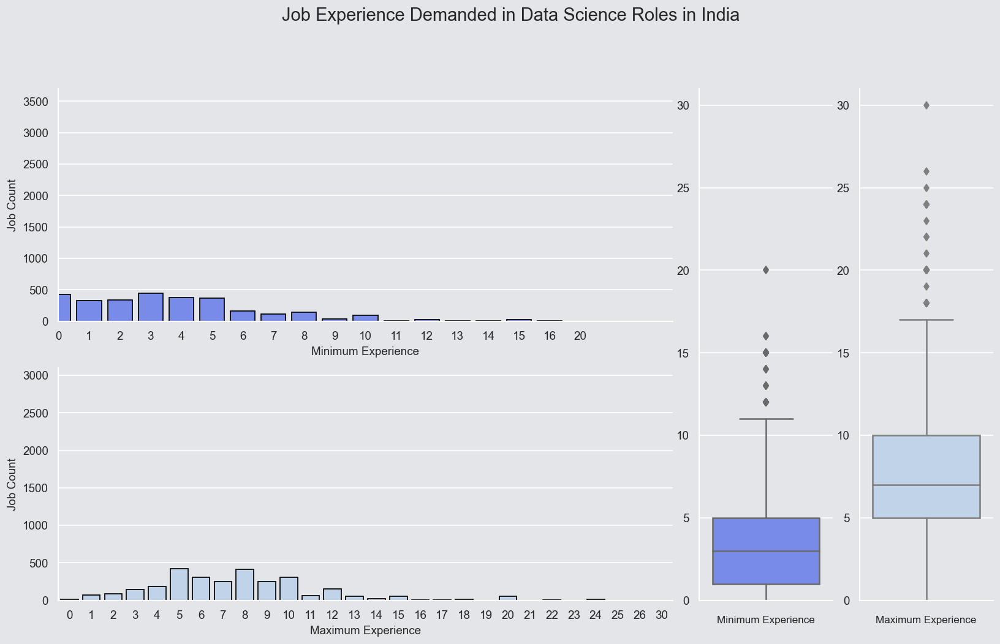

In [85]:
# plot - Job Experience Demanded in Data Science Roles in India

fig = plt.figure(figsize=(16, 9), dpi=123, facecolor='#e4e5e9')
spec = fig.add_gridspec(ncols=6, nrows=2)

ax0 = fig.add_subplot(spec[0, :4])
sns.countplot(x='Min. Exp.',data=df, color='#657ffb', edgecolor='black')
plt.ylabel("Job Count", fontsize=11)
plt.xlabel('Minimum Experience', fontsize=11)
plt.xlim(0,20)
plt.ylim(0,3700)

ax1 = fig.add_subplot(spec[1, :4])
sns.countplot(x='Max. Exp.',data=df, color='#bad2ef',  edgecolor='black')
plt.ylabel("Job Count", fontsize=11)
plt.xlabel('Maximum Experience', fontsize=11)
plt.ylim(0,3100)
# plt.xlim(0,20)

ax2 = fig.add_subplot(spec[:, 4])
sns.boxplot(y=df['Min. Exp.'], color='#657ffb')
plt.xlabel('Minimum Experience',labelpad=5, fontsize=10)
plt.ylim(0,31)
plt.ylabel('')

ax3 = fig.add_subplot(spec[:, 5])
sns.boxplot(y=df['Max. Exp.'], color='#BAD2EF')
plt.xlabel('Maximum Experience',labelpad=5, fontsize=10)
plt.ylabel('')
plt.ylim(0,31)

for ax in [ax0,ax1,ax2,ax3]:
    ax.patch.set_alpha(0.0)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

fig.suptitle('Job Experience Demanded in Data Science Roles in India', fontsize=17, y=1)
plt.show()

In [86]:
# Average Minimum Job Experience Required Top Jobs
job_list = df['Job Post'].value_counts().iloc[:10].index.tolist()  
exp = [round(df[df['Job Post']==job]['Min. Exp.'].mean(),2) for job in job_list]

df_job=pd.DataFrame({'Jobs':job_list, 'Average Min. Exp':exp})
df_job=df_job.sort_values('Average Min. Exp', ascending=False)
df_job

,Jobs,Average Min. Exp
4,Software Principal Engineer,7.25
1,Senior Software Engineer,6.00
5,Software Senior Engineer,5.09
2,Java Full Stack Developer,4.19
8,Senior Technical Consultant,3.78
9,Azure Data Engineer,3.67
6,Dot Net Developer,3.60
0,Java Developer,3.55
3,Software Engineer,3.06
7,Customer Service Executive,0.33


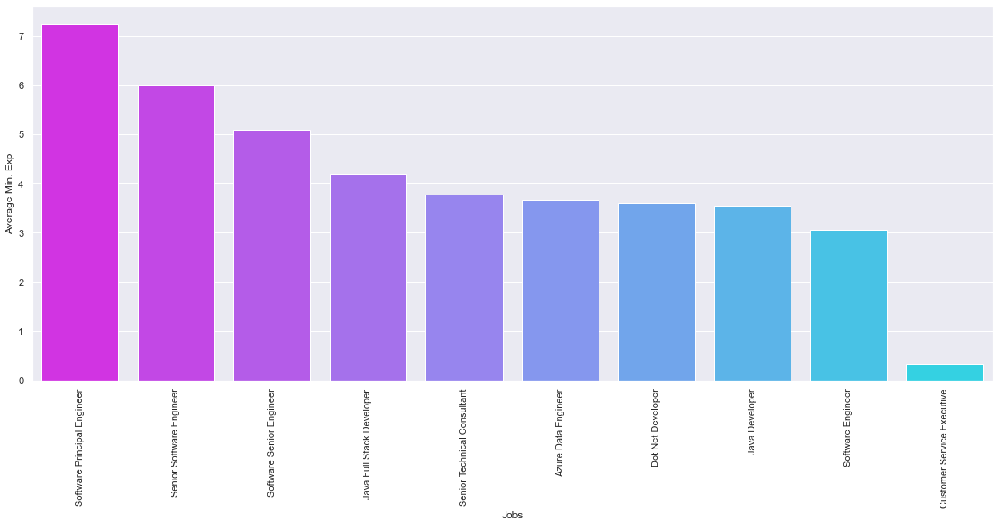

In [87]:
plt.figure(figsize = (20, 8))
sns.barplot(x = 'Jobs',y = 'Average Min. Exp',data = df_job,palette=("cool_r"))
plt.xlabel("Jobs")
plt.ylabel("Average Min. Exp")
plt.xticks(rotation=90)
plt.show()

#### 7) Company Vs Max.Exp

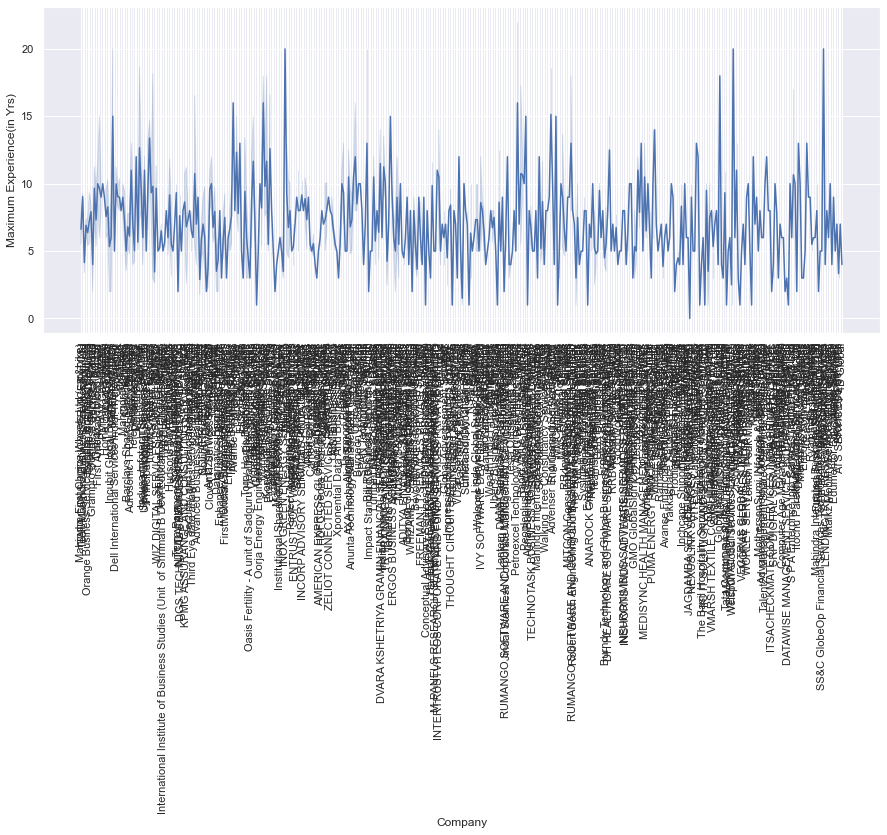

In [88]:
plt.figure(figsize=(15,6))
sns.lineplot(df['Company'],df['Max. Exp.'])
plt.xlabel('Company')
plt.ylabel('Maximum Experience(in Yrs)')
plt.xticks(rotation=90)
plt.show()

In [89]:
df['Company']

0             Mahindra First Choice Wheels Ltd (car&bike)
1             Mahindra First Choice Wheels Ltd (car&bike)
2             Mahindra First Choice Wheels Ltd (car&bike)
3             Mahindra First Choice Wheels Ltd (car&bike)
4             Mahindra First Choice Wheels Ltd (car&bike)
                              ...                        
3811    S P A Enterprise Info Services (India) Private...
3812                                 Teleperformance (TP)
3813                                 Home Bazaar Services
3814                                 Teleperformance (TP)
3815                                                  T&m
Name: Company, Length: 2908, dtype: object

#### 8) Company Vs Min. Exp

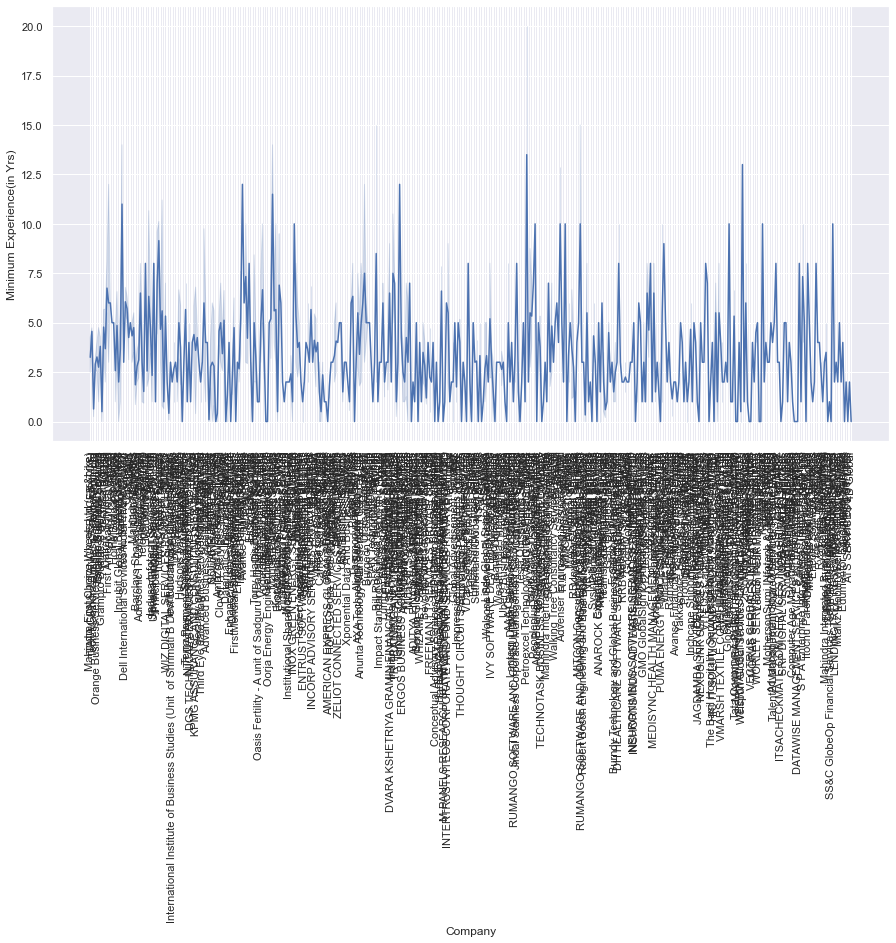

In [90]:
plt.figure(figsize=(15,8))
sns.lineplot(df['Company'],df['Min. Exp.'])
plt.xlabel('Company')
plt.ylabel('Minimum Experience(in Yrs)')
plt.xticks(rotation=90)
plt.show()

### C) Multivariate Analysis

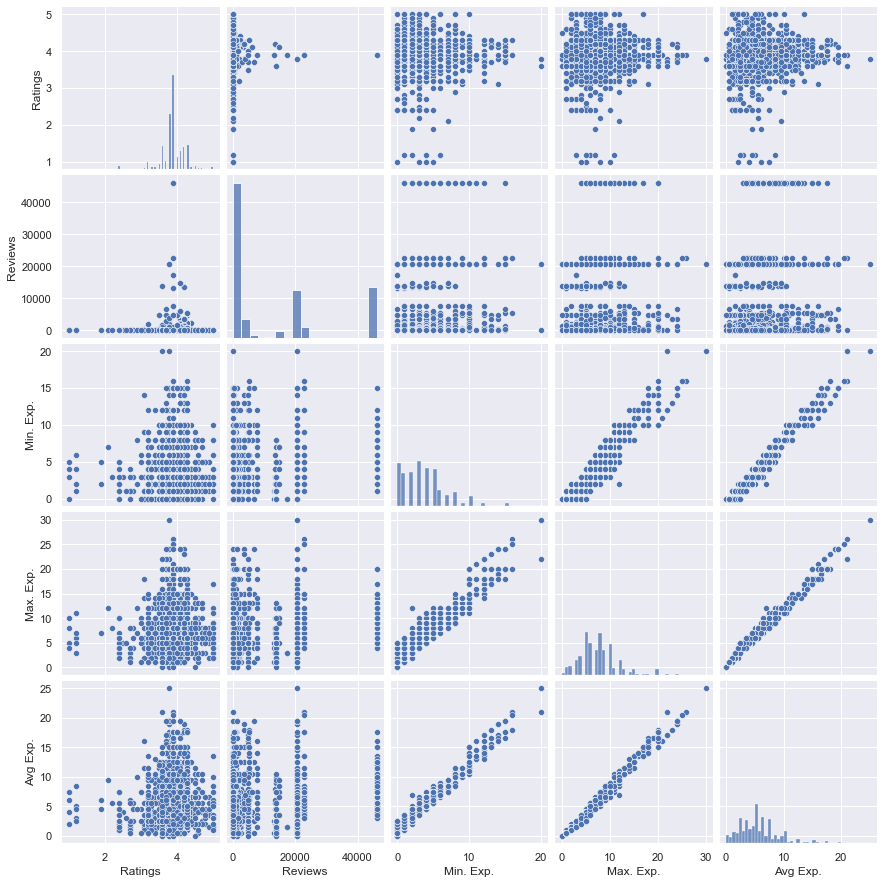

In [91]:
sns.pairplot(df)

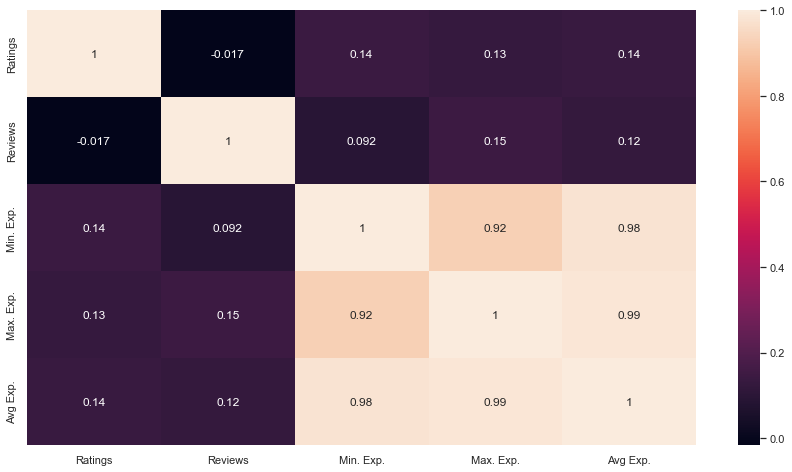

In [92]:
plt.figure(figsize=(15,8))
sns.heatmap(df.corr(), annot = True)
plt.show()

In [93]:
new = df.groupby(['Company','Job Post','Location'])['URL'].agg('count').reset_index()
display(new)

,Company,Job Post,Location,URL
0,2iSolutions Consulting Service,Onsite Job opportunities For SAP Consultants |...,Algeria,1
1,2iSolutions Consulting Service,Onsite Job opportunities For SAP Professionals...,Algeria,1
2,4D Global,4D Global-Openings For AR Callers/Sr. AR Calle...,Chennai(Ekkaduthangal),1
3,A2z Online Services,Chartered Accountant - CA,Pune,1
4,AAA Capital Services Private Limited,Recovery Officer - Gwalior,Gwalior,1
...,...,...,...,...
2704,idfc first bank,Senior Developer,Mumbai,1
2705,idfc first bank,Senior Developer,Remote,1
2706,idfc first bank,Territory Manager-Personal Loan (Partner Busin...,Jamshedpur,1
2707,inMorphis Services,"Job Alert | Servicenow Sr. Developer | Noida, ...","Noida, Bangalore/Bengaluru, Mumbai (All Areas)",1


## Data Cleaning

In [94]:
#xyz = df[(df['Job Post']=="Java Developer") | (df['Job Post']=="Software Engineer")]
#xyz

In [95]:
df2 =df.copy()

In [96]:
df2.shape

(2908, 14)

In [97]:
# Top 10 Companies
df_company

,Company,Job Openings
0,TATA CONSULTANCY SERVICES (TCS),507
1,Tech Mahindra,472
2,Capgemini,104
3,Dun & Bradstreet,97
4,Orange Business Services,86
5,Amazon Web Services (AWS),68
6,Teleperformance (TP),56
7,Tech Mahindra Business Services Pvt. Ltd,52
8,Dell International Services IndiaPrivate Limited,52
9,Harman Connected Services Corporation India Pvt.,45


In [98]:
#df_company=df_company[:6]
#df_company

In [99]:
x = df_company['Company']

df3 =pd.DataFrame()
for i in x:
    z = df[df["Company"]==i]
    df3 = df3.append(z)
    
df3

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp
16,Tcs is Hiring For Power BI Platform Administra...,TATA CONSULTANCY SERVICES (TCS),"Power BI administration,IT Skills,AWS,Power BI...",3.9,46198,5-8,Not disclosed,Pune,Today,https://www.naukri.com/job-listings-tcs-is-hir...,5,8,6.5,1
17,Cloud Architect-AWS/Azure/Talend,TATA CONSULTANCY SERVICES (TCS),"ETL Architect,Cloud Architecture,Azure Cloud A...",3.9,46198,10-17,Not disclosed,Bangalore/Bengaluru,2 Days Ago,https://www.naukri.com/job-listings-cloud-arch...,10,17,13.5,3
18,Azure Data Bricks including Pythonapi Integration,TATA CONSULTANCY SERVICES (TCS),"ORC,XML,CSV,API Integration,Azure Databricks,E...",3.9,46198,5-10,Not disclosed,"Noida, Kolkata, Chennai, Bangalore/Bengaluru, ...",Today,https://www.naukri.com/job-listings-azure-data...,5,10,7.5,1
19,Dot Net Developer,TATA CONSULTANCY SERVICES (TCS),"angular,.net core,ASP.Net,MVC,analytical,Agile...",3.9,46198,5-10,Not disclosed,Bangalore/Bengaluru,7 Days Ago,https://www.naukri.com/job-listings-dot-net-de...,5,10,7.5,1
20,AWS QA Test Automation Architect,TATA CONSULTANCY SERVICES (TCS),"automation framework,selenium,automation testi...",3.9,46198,8-10,Not disclosed,Pan India,7 Days Ago,https://www.naukri.com/job-listings-aws-qa-tes...,8,10,9.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3218,Manager - Global Learning and development,Harman Connected Services Corporation India Pvt.,"Automation,Due diligence,Usage,Claims,LMS,Staf...",3.9,936,3-8,Not disclosed,"United States (USA), Bangalore/Bengaluru",7 Days Ago,https://www.naukri.com/job-listings-manager-gl...,3,8,5.5,1
3219,"Manager , Finance",Harman Connected Services Corporation India Pvt.,"Data analysis,Automation,Due diligence,Usage,C...",3.9,936,8-10,Not disclosed,"United States (USA), Bangalore/Bengaluru",7 Days Ago,https://www.naukri.com/job-listings-manager-fi...,8,10,9.0,2
3220,Lead - Corporate Quality,Harman Connected Services Corporation India Pvt.,"Automation,Due diligence,Claims,ISO,Staffing,P...",3.9,936,5-9,Not disclosed,"United States (USA), Bangalore/Bengaluru",7 Days Ago,https://www.naukri.com/job-listings-lead-corpo...,5,9,7.0,1
3221,Engineer,Harman Connected Services Corporation India Pvt.,"C++,Claims,Networking,Linux,Staffing,XML,Javas...",3.9,936,8-12,Not disclosed,"United States (USA), Bangalore/Bengaluru",7 Days Ago,https://www.naukri.com/job-listings-engineer-h...,8,12,10.0,2


In [100]:
df3.reset_index(inplace = True,drop=True)
df3

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp
0,Tcs is Hiring For Power BI Platform Administra...,TATA CONSULTANCY SERVICES (TCS),"Power BI administration,IT Skills,AWS,Power BI...",3.9,46198,5-8,Not disclosed,Pune,Today,https://www.naukri.com/job-listings-tcs-is-hir...,5,8,6.5,1
1,Cloud Architect-AWS/Azure/Talend,TATA CONSULTANCY SERVICES (TCS),"ETL Architect,Cloud Architecture,Azure Cloud A...",3.9,46198,10-17,Not disclosed,Bangalore/Bengaluru,2 Days Ago,https://www.naukri.com/job-listings-cloud-arch...,10,17,13.5,3
2,Azure Data Bricks including Pythonapi Integration,TATA CONSULTANCY SERVICES (TCS),"ORC,XML,CSV,API Integration,Azure Databricks,E...",3.9,46198,5-10,Not disclosed,"Noida, Kolkata, Chennai, Bangalore/Bengaluru, ...",Today,https://www.naukri.com/job-listings-azure-data...,5,10,7.5,1
3,Dot Net Developer,TATA CONSULTANCY SERVICES (TCS),"angular,.net core,ASP.Net,MVC,analytical,Agile...",3.9,46198,5-10,Not disclosed,Bangalore/Bengaluru,7 Days Ago,https://www.naukri.com/job-listings-dot-net-de...,5,10,7.5,1
4,AWS QA Test Automation Architect,TATA CONSULTANCY SERVICES (TCS),"automation framework,selenium,automation testi...",3.9,46198,8-10,Not disclosed,Pan India,7 Days Ago,https://www.naukri.com/job-listings-aws-qa-tes...,8,10,9.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1534,Manager - Global Learning and development,Harman Connected Services Corporation India Pvt.,"Automation,Due diligence,Usage,Claims,LMS,Staf...",3.9,936,3-8,Not disclosed,"United States (USA), Bangalore/Bengaluru",7 Days Ago,https://www.naukri.com/job-listings-manager-gl...,3,8,5.5,1
1535,"Manager , Finance",Harman Connected Services Corporation India Pvt.,"Data analysis,Automation,Due diligence,Usage,C...",3.9,936,8-10,Not disclosed,"United States (USA), Bangalore/Bengaluru",7 Days Ago,https://www.naukri.com/job-listings-manager-fi...,8,10,9.0,2
1536,Lead - Corporate Quality,Harman Connected Services Corporation India Pvt.,"Automation,Due diligence,Claims,ISO,Staffing,P...",3.9,936,5-9,Not disclosed,"United States (USA), Bangalore/Bengaluru",7 Days Ago,https://www.naukri.com/job-listings-lead-corpo...,5,9,7.0,1
1537,Engineer,Harman Connected Services Corporation India Pvt.,"C++,Claims,Networking,Linux,Staffing,XML,Javas...",3.9,936,8-12,Not disclosed,"United States (USA), Bangalore/Bengaluru",7 Days Ago,https://www.naukri.com/job-listings-engineer-h...,8,12,10.0,2


# Job Post

In [101]:
# top 10 jobs
job_all=df3['Job Post'].value_counts().rename_axis('Job Post').reset_index(name='Count')
job_all.style.background_gradient(cmap='mako_r')

,Job Post,Count
0,Software Principal Engineer,16
1,Java Developer,15
2,Senior Software Engineer,15
3,Software Senior Engineer,11
4,Java Full Stack Developer,10
5,Software Engineer,9
6,Senior Technical Consultant,8
7,Customer Support Executive,7
8,Senior QA Engineer,7
9,Customer Service Executive,7


In [102]:
for r in (('Software Senior Engineer','Senior Software Engineer'),('Software Engineer 2','Software Engineer'),('Software Engineer II','Software Engineer'),('Engineer II , SW','Software Engineer'),('Tech Mahindra Hiring For Technical Support - Australian Process','Technical Support - Australian Process'),('SENIOR TECHNICAL CONSULTANT','Senior Technical Consultant'),('AI&ML_SME_Tata Consultancy Services(Tcs)','AI&ML_SME'),('Huge Opening For Customer Support - Inbound Voice Process','Customer Support - Inbound Voice Process'),('Hiring For UK Sales-Voice Process','UK Sales-Voice Process'),('Tech Mahindra Hiring For Voice Process - Customer Support','Customer Support - Inbound Voice Process'),('Tech Mahindra Hiring For HR Recruiter','HR Recruiter'),('Python_SME_Tata Consultancy Services(Tcs)','Python_SME'),('Teleperformance hiring For premium process.','Premium Process')):
    df3['Job Post'] = df3['Job Post'].replace(*r)

In [103]:
# top 10 jobs
job_all=df3['Job Post'].value_counts().rename_axis('Job Post').reset_index(name='Count')
job_all.style.background_gradient(cmap='mako_r')

,Job Post,Count
0,Senior Software Engineer,26
1,Software Engineer,22
2,Software Principal Engineer,16
3,Java Developer,15
4,Senior Technical Consultant,12
5,Java Full Stack Developer,10
6,Customer Service Executive,7
7,Customer Support Executive,7
8,Senior QA Engineer,7
9,TDT Consultant,6


In [104]:
x1 = job_all['Job Post'].where(job_all['Count']>2).dropna()
x1
#x1.count()

0                              Senior Software Engineer
1                                     Software Engineer
2                           Software Principal Engineer
3                                        Java Developer
4                           Senior Technical Consultant
5                             Java Full Stack Developer
6                            Customer Service Executive
7                            Customer Support Executive
8                                    Senior QA Engineer
9                                        TDT Consultant
10                                    Dot Net Developer
11                                   React JS Developer
12             Customer Support - Inbound Voice Process
13                                  SAP ABAP Consultant
14    Tech Mahindra is Hiring For Technical Support ...
15                                Senior Java Developer
16                International Voice Process Executive
17                                      DevOps E

In [105]:
df4 =pd.DataFrame()
for i in x1:
    z = df3[df3["Job Post"]==i]
    df4 = df4.append(z)
    
df4

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp
934,Senior Software Engineer,Tech Mahindra,"karma,angular,VUE JS,javascript,jquery,SonarQu...",3.8,20690,5-9,"5,00,000 - 15,00,000 PA.",Hyderabad/Secunderabad,27 Days Ago,https://www.naukri.com/job-listings-senior-sof...,5,9,7.0,1
1087,Senior Software Engineer,Dun & Bradstreet,"XML,Agile,Troubleshooting,Open source,SDLC,GIT...",3.9,185,5-10,Not disclosed,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1
1108,Senior Software Engineer,Dun & Bradstreet,"j2ee,JBPM,GCP,BPMN,REST APIs,Drools,REST,Unix",3.9,185,2-5,Not disclosed,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,2,5,3.5,0
1115,Senior Software Engineer,Dun & Bradstreet,"Information security,Agile,Open source,SDLC,SQ...",3.9,185,8-12,Not disclosed,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2
1122,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,Not disclosed,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2
1130,Senior Software Engineer,Dun & Bradstreet,"Active directory,Agile,microsoft,SQL,Python,IT...",3.9,185,8-10,Not disclosed,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,10,9.0,2
1140,Senior Software Engineer,Dun & Bradstreet,"Automation,Coding,Javascript,Data structures,P...",3.9,185,5-10,Not disclosed,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1
1168,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,Not disclosed,Hyderabad/Secunderabad,7 Days Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2
1173,Senior Software Engineer,Dun & Bradstreet,"Automation,Coding,Javascript,Data structures,P...",3.9,185,5-10,Not disclosed,Hyderabad/Secunderabad,7 Days Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1
1219,Senior Software Engineer,Orange Business Services,"BIX,IT Skills,Testing,technical support,Pega U...",4.3,891,7-12,Not disclosed,Gurgaon/Gurugram,11 Days Ago,https://www.naukri.com/job-listings-senior-sof...,7,12,9.5,2


In [106]:
df4.shape

(248, 14)

In [107]:
df4.reset_index(inplace = True,drop=True)
df4

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp
0,Senior Software Engineer,Tech Mahindra,"karma,angular,VUE JS,javascript,jquery,SonarQu...",3.8,20690,5-9,"5,00,000 - 15,00,000 PA.",Hyderabad/Secunderabad,27 Days Ago,https://www.naukri.com/job-listings-senior-sof...,5,9,7.0,1
1,Senior Software Engineer,Dun & Bradstreet,"XML,Agile,Troubleshooting,Open source,SDLC,GIT...",3.9,185,5-10,Not disclosed,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1
2,Senior Software Engineer,Dun & Bradstreet,"j2ee,JBPM,GCP,BPMN,REST APIs,Drools,REST,Unix",3.9,185,2-5,Not disclosed,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,2,5,3.5,0
3,Senior Software Engineer,Dun & Bradstreet,"Information security,Agile,Open source,SDLC,SQ...",3.9,185,8-12,Not disclosed,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2
4,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,Not disclosed,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2
5,Senior Software Engineer,Dun & Bradstreet,"Active directory,Agile,microsoft,SQL,Python,IT...",3.9,185,8-10,Not disclosed,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,10,9.0,2
6,Senior Software Engineer,Dun & Bradstreet,"Automation,Coding,Javascript,Data structures,P...",3.9,185,5-10,Not disclosed,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1
7,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,Not disclosed,Hyderabad/Secunderabad,7 Days Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2
8,Senior Software Engineer,Dun & Bradstreet,"Automation,Coding,Javascript,Data structures,P...",3.9,185,5-10,Not disclosed,Hyderabad/Secunderabad,7 Days Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1
9,Senior Software Engineer,Orange Business Services,"BIX,IT Skills,Testing,technical support,Pega U...",4.3,891,7-12,Not disclosed,Gurgaon/Gurugram,11 Days Ago,https://www.naukri.com/job-listings-senior-sof...,7,12,9.5,2


# Salary

In [108]:
display(df4['Salary'].value_counts())
pd.set_option('display.max_rows', 500)

Not disclosed                194
5,00,000 - 15,00,000 PA.       6
2,00,000 - 2,50,000 PA.        3
2,25,000 - 5,00,000 PA.        3
1,50,000 - 3,00,000 PA.        3
1,75,000 - 2,25,000 PA.        3
2,25,000 - 6,00,000 PA.        2
3,00,000 - 4,00,000 PA.        2
3,00,000 - 5,00,000 PA.        2
50,000 - 2,00,000 PA.          2
2,25,000 - 4,00,000 PA.        2
50,000 - 2,25,000 PA.          2
1,25,000 - 2,75,000 PA.        2
2,25,000 - 5,50,000 PA.        2
2,50,000 - 3,50,000 PA.        1
7,00,000 - 14,00,000 PA.       1
1,75,000 - 3,50,000 PA.        1
1,75,000 - 3,00,000 PA.        1
2,50,000 - 4,50,000 PA.        1
18,00,000 - 25,00,000 PA.      1
2,00,000 - 3,00,000 PA.        1
10,00,000 - 20,00,000 PA.      1
3,00,000 - 8,00,000 PA.        1
8,00,000 - 18,00,000 PA.       1
7,50,000 - 16,00,000 PA.       1
1,50,000 - 2,50,000 PA.        1
2,00,000 - 3,50,000 PA.        1
1,75,000 - 2,75,000 PA.        1
20,00,000 - 35,00,000 PA.      1
1,25,000 - 2,50,000 PA.        1
1,25,000 -

In [109]:
def clean_text1(text):
    '''Make text lowercase, remove text in square brackets, remove punctuation and remove words containing numbers.'''
    text = re.sub('PA.',' ',text)
    text = re.sub('Not disclosed','0-0',text)
    #text = re.sub('Lessthan','',text)
    text = re.sub(',','',text)
    text = re.sub('\s','',text)
    #text = re.sub('Lessthan0','',text)
    #text = re.sub('\w+\d+','',text)
    return text

clean4 = lambda x: clean_text1(x)

In [110]:
df4['Salary'] = df4['Salary'].apply(clean4)
df4.head(5)

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp
0,Senior Software Engineer,Tech Mahindra,"karma,angular,VUE JS,javascript,jquery,SonarQu...",3.8,20690,5-9,500000-1500000,Hyderabad/Secunderabad,27 Days Ago,https://www.naukri.com/job-listings-senior-sof...,5,9,7.0,1
1,Senior Software Engineer,Dun & Bradstreet,"XML,Agile,Troubleshooting,Open source,SDLC,GIT...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1
2,Senior Software Engineer,Dun & Bradstreet,"j2ee,JBPM,GCP,BPMN,REST APIs,Drools,REST,Unix",3.9,185,2-5,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,2,5,3.5,0
3,Senior Software Engineer,Dun & Bradstreet,"Information security,Agile,Open source,SDLC,SQ...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2
4,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2


In [111]:
display(df4['Salary'].value_counts())
pd.set_option('display.max_rows', 500)

0-0                194
500000-1500000       6
200000-250000        3
225000-500000        3
150000-300000        3
175000-225000        3
225000-600000        2
300000-400000        2
300000-500000        2
50000-200000         2
225000-400000        2
50000-225000         2
125000-275000        2
225000-550000        2
250000-350000        1
700000-1400000       1
175000-350000        1
175000-300000        1
250000-450000        1
1800000-2500000      1
200000-300000        1
1000000-2000000      1
300000-800000        1
800000-1800000       1
750000-1600000       1
150000-250000        1
200000-350000        1
175000-275000        1
2000000-3500000      1
125000-250000        1
125000-200000        1
1500000-2250000      1
50000-300000         1
125000-175000        1
Name: Salary, dtype: int64

In [112]:
# new features
df4['Min. Salary'] = df4['Salary'].apply(MinExp)
df4['Max. Salary'] = df4['Salary'].apply(MaxExp)

In [113]:
df4

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp,Min. Salary,Max. Salary
0,Senior Software Engineer,Tech Mahindra,"karma,angular,VUE JS,javascript,jquery,SonarQu...",3.8,20690,5-9,500000-1500000,Hyderabad/Secunderabad,27 Days Ago,https://www.naukri.com/job-listings-senior-sof...,5,9,7.0,1,500000,1500000
1,Senior Software Engineer,Dun & Bradstreet,"XML,Agile,Troubleshooting,Open source,SDLC,GIT...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1,0,0
2,Senior Software Engineer,Dun & Bradstreet,"j2ee,JBPM,GCP,BPMN,REST APIs,Drools,REST,Unix",3.9,185,2-5,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,2,5,3.5,0,0,0
3,Senior Software Engineer,Dun & Bradstreet,"Information security,Agile,Open source,SDLC,SQ...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2,0,0
4,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2,0,0
5,Senior Software Engineer,Dun & Bradstreet,"Active directory,Agile,microsoft,SQL,Python,IT...",3.9,185,8-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,10,9.0,2,0,0
6,Senior Software Engineer,Dun & Bradstreet,"Automation,Coding,Javascript,Data structures,P...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1,0,0
7,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,7 Days Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2,0,0
8,Senior Software Engineer,Dun & Bradstreet,"Automation,Coding,Javascript,Data structures,P...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,7 Days Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1,0,0
9,Senior Software Engineer,Orange Business Services,"BIX,IT Skills,Testing,technical support,Pega U...",4.3,891,7-12,0-0,Gurgaon/Gurugram,11 Days Ago,https://www.naukri.com/job-listings-senior-sof...,7,12,9.5,2,0,0


In [114]:
df4['Avg Salary'] = df4[['Min. Salary','Max. Salary']].mean(axis=1).astype(int)

In [115]:
print("Maximum Average Salary =",max(df4['Avg Salary']))
print("Minimum Avearge Salary =",min(df4['Avg Salary']))

Maximum Average Salary = 2750000
Minimum Avearge Salary = 0


In [116]:
''' binning or bucketing with range'''
 
bins = [0, 500000, 1000000, 1500000, 2000000, 2500000, 3000000]
df4['binned'] = pd.cut(df4['Avg Salary'], bins)
df4.head()

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp,Min. Salary,Max. Salary,Avg Salary,binned
0,Senior Software Engineer,Tech Mahindra,"karma,angular,VUE JS,javascript,jquery,SonarQu...",3.8,20690,5-9,500000-1500000,Hyderabad/Secunderabad,27 Days Ago,https://www.naukri.com/job-listings-senior-sof...,5,9,7.0,1,500000,1500000,1000000,"(500000.0, 1000000.0]"
1,Senior Software Engineer,Dun & Bradstreet,"XML,Agile,Troubleshooting,Open source,SDLC,GIT...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1,0,0,0,NaN
2,Senior Software Engineer,Dun & Bradstreet,"j2ee,JBPM,GCP,BPMN,REST APIs,Drools,REST,Unix",3.9,185,2-5,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,2,5,3.5,0,0,0,0,NaN
3,Senior Software Engineer,Dun & Bradstreet,"Information security,Agile,Open source,SDLC,SQ...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2,0,0,0,NaN
4,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2,0,0,0,NaN


In [117]:
''' binning or bucketing with labels'''
 
bins = [0, 500000, 1000000, 1500000, 2000000, 2500000, 3000000]
labels =[1,2,3,4,5,6]
df4['BinnedSalary'] = pd.cut(df4['Avg Salary'], bins,labels=labels)
df4.head(30)

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp,Min. Salary,Max. Salary,Avg Salary,binned,BinnedSalary
0,Senior Software Engineer,Tech Mahindra,"karma,angular,VUE JS,javascript,jquery,SonarQu...",3.8,20690,5-9,500000-1500000,Hyderabad/Secunderabad,27 Days Ago,https://www.naukri.com/job-listings-senior-sof...,5,9,7.0,1,500000,1500000,1000000,"(500000.0, 1000000.0]",2
1,Senior Software Engineer,Dun & Bradstreet,"XML,Agile,Troubleshooting,Open source,SDLC,GIT...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1,0,0,0,NaN,NaN
2,Senior Software Engineer,Dun & Bradstreet,"j2ee,JBPM,GCP,BPMN,REST APIs,Drools,REST,Unix",3.9,185,2-5,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,2,5,3.5,0,0,0,0,NaN,NaN
3,Senior Software Engineer,Dun & Bradstreet,"Information security,Agile,Open source,SDLC,SQ...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2,0,0,0,NaN,NaN
4,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2,0,0,0,NaN,NaN
5,Senior Software Engineer,Dun & Bradstreet,"Active directory,Agile,microsoft,SQL,Python,IT...",3.9,185,8-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,10,9.0,2,0,0,0,NaN,NaN
6,Senior Software Engineer,Dun & Bradstreet,"Automation,Coding,Javascript,Data structures,P...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1,0,0,0,NaN,NaN
7,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,7 Days Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2,0,0,0,NaN,NaN
8,Senior Software Engineer,Dun & Bradstreet,"Automation,Coding,Javascript,Data structures,P...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,7 Days Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1,0,0,0,NaN,NaN
9,Senior Software Engineer,Orange Business Services,"BIX,IT Skills,Testing,technical support,Pega U...",4.3,891,7-12,0-0,Gurgaon/Gurugram,11 Days Ago,https://www.naukri.com/job-listings-senior-sof...,7,12,9.5,2,0,0,0,NaN,NaN


In [118]:
df4['BinnedSalary'].unique()

[2, NaN, 1, 4, 6, 3, 5]
Categories (6, int64): [1 < 2 < 3 < 4 < 5 < 6]

In [119]:
# import modules
import numpy
df4['BinnedSalary']=numpy.nan_to_num(df4['BinnedSalary'])

In [120]:
df4.head()

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp,Min. Salary,Max. Salary,Avg Salary,binned,BinnedSalary
0,Senior Software Engineer,Tech Mahindra,"karma,angular,VUE JS,javascript,jquery,SonarQu...",3.8,20690,5-9,500000-1500000,Hyderabad/Secunderabad,27 Days Ago,https://www.naukri.com/job-listings-senior-sof...,5,9,7.0,1,500000,1500000,1000000,"(500000.0, 1000000.0]",2.0
1,Senior Software Engineer,Dun & Bradstreet,"XML,Agile,Troubleshooting,Open source,SDLC,GIT...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1,0,0,0,NaN,0.0
2,Senior Software Engineer,Dun & Bradstreet,"j2ee,JBPM,GCP,BPMN,REST APIs,Drools,REST,Unix",3.9,185,2-5,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,2,5,3.5,0,0,0,0,NaN,0.0
3,Senior Software Engineer,Dun & Bradstreet,"Information security,Agile,Open source,SDLC,SQ...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2,0,0,0,NaN,0.0
4,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2,0,0,0,NaN,0.0


In [121]:
df4['BinnedSalary'].unique()

array([2., 0., 1., 4., 6., 3., 5.])

In [122]:
df4['BinnedSalary']=df4['BinnedSalary'].astype(int)
df4.head()

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp,Min. Salary,Max. Salary,Avg Salary,binned,BinnedSalary
0,Senior Software Engineer,Tech Mahindra,"karma,angular,VUE JS,javascript,jquery,SonarQu...",3.8,20690,5-9,500000-1500000,Hyderabad/Secunderabad,27 Days Ago,https://www.naukri.com/job-listings-senior-sof...,5,9,7.0,1,500000,1500000,1000000,"(500000.0, 1000000.0]",2
1,Senior Software Engineer,Dun & Bradstreet,"XML,Agile,Troubleshooting,Open source,SDLC,GIT...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,5,10,7.5,1,0,0,0,NaN,0
2,Senior Software Engineer,Dun & Bradstreet,"j2ee,JBPM,GCP,BPMN,REST APIs,Drools,REST,Unix",3.9,185,2-5,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,2,5,3.5,0,0,0,0,NaN,0
3,Senior Software Engineer,Dun & Bradstreet,"Information security,Agile,Open source,SDLC,SQ...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2,0,0,0,NaN,0
4,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,8,12,10.0,2,0,0,0,NaN,0


In [123]:
df4['BinnedSalary'].unique()

array([2, 0, 1, 4, 6, 3, 5])

# Location

In [124]:
#df4['Location'].value_counts().index[0]

In [125]:
#x=df4['Location'].str.split(",")
#x

In [126]:
type(x)

pandas.core.series.Series

In [127]:
#for item in x:
    #print(item[0])

In [128]:
def preprocess_location1(loc):
    loc=re.split(',', loc)[0].strip()
    #loc=re.sub('New Delhi','Delhi',loc)
    return loc

In [129]:
df4['Loc']=df4['Location'].apply(preprocess_location1)

In [130]:
df4['skill'] = df4['Skills'].apply(preprocess_location1)

In [131]:
df4

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,...,Max. Exp.,Avg Exp.,BinnedExp,Min. Salary,Max. Salary,Avg Salary,binned,BinnedSalary,Loc,skill
0,Senior Software Engineer,Tech Mahindra,"karma,angular,VUE JS,javascript,jquery,SonarQu...",3.8,20690,5-9,500000-1500000,Hyderabad/Secunderabad,27 Days Ago,https://www.naukri.com/job-listings-senior-sof...,...,9,7.0,1,500000,1500000,1000000,"(500000.0, 1000000.0]",2,Hyderabad/Secunderabad,karma
1,Senior Software Engineer,Dun & Bradstreet,"XML,Agile,Troubleshooting,Open source,SDLC,GIT...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,...,10,7.5,1,0,0,0,NaN,0,Hyderabad/Secunderabad,XML
2,Senior Software Engineer,Dun & Bradstreet,"j2ee,JBPM,GCP,BPMN,REST APIs,Drools,REST,Unix",3.9,185,2-5,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,...,5,3.5,0,0,0,0,NaN,0,Hyderabad/Secunderabad,j2ee
3,Senior Software Engineer,Dun & Bradstreet,"Information security,Agile,Open source,SDLC,SQ...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,...,12,10.0,2,0,0,0,NaN,0,Hyderabad/Secunderabad,Information security
4,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,...,12,10.0,2,0,0,0,NaN,0,Hyderabad/Secunderabad,Unix
5,Senior Software Engineer,Dun & Bradstreet,"Active directory,Agile,microsoft,SQL,Python,IT...",3.9,185,8-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,...,10,9.0,2,0,0,0,NaN,0,Hyderabad/Secunderabad,Active directory
6,Senior Software Engineer,Dun & Bradstreet,"Automation,Coding,Javascript,Data structures,P...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,1 Day Ago,https://www.naukri.com/job-listings-senior-sof...,...,10,7.5,1,0,0,0,NaN,0,Hyderabad/Secunderabad,Automation
7,Senior Software Engineer,Dun & Bradstreet,"Unix,Automation,Agile,Data structures,Python,S...",3.9,185,8-12,0-0,Hyderabad/Secunderabad,7 Days Ago,https://www.naukri.com/job-listings-senior-sof...,...,12,10.0,2,0,0,0,NaN,0,Hyderabad/Secunderabad,Unix
8,Senior Software Engineer,Dun & Bradstreet,"Automation,Coding,Javascript,Data structures,P...",3.9,185,5-10,0-0,Hyderabad/Secunderabad,7 Days Ago,https://www.naukri.com/job-listings-senior-sof...,...,10,7.5,1,0,0,0,NaN,0,Hyderabad/Secunderabad,Automation
9,Senior Software Engineer,Orange Business Services,"BIX,IT Skills,Testing,technical support,Pega U...",4.3,891,7-12,0-0,Gurgaon/Gurugram,11 Days Ago,https://www.naukri.com/job-listings-senior-sof...,...,12,9.5,2,0,0,0,NaN,0,Gurgaon/Gurugram,BIX


# Model Building

In [132]:
df5 = df4.copy()

In [133]:
df5.columns

Index(['Job Post', 'Company', 'Skills', 'Ratings', 'Reviews',
       'Experience(in Yrs)', 'Salary', 'Location', 'Job_Post_History', 'URL',
       'Min. Exp.', 'Max. Exp.', 'Avg Exp.', 'BinnedExp', 'Min. Salary',
       'Max. Salary', 'Avg Salary', 'binned', 'BinnedSalary', 'Loc', 'skill'],
      dtype='object')

In [134]:
df5 = df5[['Job Post','BinnedExp','BinnedSalary','Loc', 'skill', 'Company']]

In [135]:
df5

,Job Post,BinnedExp,BinnedSalary,Loc,skill,Company
0,Senior Software Engineer,1,2,Hyderabad/Secunderabad,karma,Tech Mahindra
1,Senior Software Engineer,1,0,Hyderabad/Secunderabad,XML,Dun & Bradstreet
2,Senior Software Engineer,0,0,Hyderabad/Secunderabad,j2ee,Dun & Bradstreet
3,Senior Software Engineer,2,0,Hyderabad/Secunderabad,Information security,Dun & Bradstreet
4,Senior Software Engineer,2,0,Hyderabad/Secunderabad,Unix,Dun & Bradstreet
5,Senior Software Engineer,2,0,Hyderabad/Secunderabad,Active directory,Dun & Bradstreet
6,Senior Software Engineer,1,0,Hyderabad/Secunderabad,Automation,Dun & Bradstreet
7,Senior Software Engineer,2,0,Hyderabad/Secunderabad,Unix,Dun & Bradstreet
8,Senior Software Engineer,1,0,Hyderabad/Secunderabad,Automation,Dun & Bradstreet
9,Senior Software Engineer,2,0,Gurgaon/Gurugram,BIX,Orange Business Services


In [136]:
#df5['Job Post'].value_counts()
#df5['BinnedExp'].value_counts()
#df5['BinnedSalary'].value_counts()
#df5['Loc'].value_counts()
#df5['skill'].value_counts()
#df5['Company'].value_counts()

In [137]:
df6 = df5.copy()

In [138]:
from sklearn.preprocessing import LabelEncoder
encode = LabelEncoder()
df6['Job Post'] = encode.fit_transform(df6['Job Post'])
df6['Loc'] = encode.fit_transform(df6['Loc'])
df6['skill'] = encode.fit_transform(df6['skill'])
df6['Company'] = encode.fit_transform(df6['Company'])

In [139]:
df6

,Job Post,BinnedExp,BinnedSalary,Loc,skill,Company
0,33,1,2,9,121,6
1,33,1,0,9,102,2
2,33,0,0,9,119,2
3,33,2,0,9,43,2
4,33,2,0,9,97,2
5,33,2,0,9,3,2
6,33,1,0,9,7,2
7,33,2,0,9,97,2
8,33,1,0,9,7,2
9,33,2,0,8,9,4


In [140]:
X = df6.drop(['Company'],axis = 1)
y = df6['Company']

In [141]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2, random_state=42)

## 1. Naive Bayes

### i. Actual

In [142]:
# fit the training dataset on the NB classifier
Naive = naive_bayes.MultinomialNB()
Naive.fit(X_train,y_train)
# predict the labels on validation dataset
predictions_NB = Naive.predict(X_test)
# Use accuracy_score function to get the accuracy
print("Naive Bayes Accuracy Score = ",accuracy_score(predictions_NB, y_test)*100)

Naive Bayes Accuracy Score =  48.0


In [143]:
accuracyN1 = accuracy_score(y_test,predictions_NB)
precisionN1 = precision_score(y_test, predictions_NB,average='macro')
recallN1 = recall_score(y_test, predictions_NB,average='macro')
f1_scoreN1 = f1_score(y_test, predictions_NB,average='macro')

In [144]:
X_train.shape

(198, 5)

In [145]:
print(classification_report(y_test, predictions_NB))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.55      0.86      0.67         7
           2       0.00      0.00      0.00         5
           3       0.29      0.40      0.33         5
           4       0.62      0.56      0.59         9
           5       0.64      0.58      0.61        12
           6       0.50      0.22      0.31         9
           7       0.00      0.00      0.00         0
           8       0.33      1.00      0.50         2

    accuracy                           0.48        50
   macro avg       0.33      0.40      0.33        50
weighted avg       0.47      0.48      0.45        50



### ii. SMOTE

In [146]:
from imblearn.over_sampling import SMOTE
from sklearn.metrics.pairwise import euclidean_distances

In [147]:
smote_balance = SMOTE(k_neighbors = 5, sampling_strategy='not majority',random_state= 42)
X_smote, y_smote = smote_balance.fit_resample(X,y)
print(y_smote.value_counts())
# y_bal.value_counts().plot.pie(autopct = '%0.2f%%')
X_train_smote,X_test_smote,y_train_smote,y_test_smote = train_test_split(X_smote,y_smote,test_size=0.2, random_state=42)

6    71
2    71
4    71
1    71
3    71
5    71
8    71
7    71
0    71
Name: Company, dtype: int64


In [148]:
NB_smote = naive_bayes.MultinomialNB()
NB_smote_model = NB_smote.fit(X_train_smote,y_train_smote)
predictions_NB1 = NB_smote.predict(X_test)
print("Naive Bayes Accuracy Score = ",accuracy_score(predictions_NB1, y_test)*100)

Naive Bayes Accuracy Score =  46.0


In [149]:
accuracyN2 = accuracy_score(y_test,predictions_NB1)
precisionN2 = precision_score(y_test, predictions_NB1,average='macro')
recallN2 = recall_score(y_test, predictions_NB1,average='macro')
f1_scoreN2 = f1_score(y_test, predictions_NB1,average='macro')

In [150]:
print(classification_report(y_test, predictions_NB1))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.71      0.71      0.71         7
           2       0.50      0.20      0.29         5
           3       0.33      0.40      0.36         5
           4       0.50      0.44      0.47         9
           5       0.71      0.42      0.53        12
           6       0.67      0.44      0.53         9
           7       0.00      0.00      0.00         0
           8       0.40      1.00      0.57         2

    accuracy                           0.46        50
   macro avg       0.43      0.40      0.39        50
weighted avg       0.58      0.46      0.49        50



## 2) SVM

### i. Actual

In [151]:
# Classifier - Algorithm - SVM
# fit the training dataset on the classifier
SVM = svm.SVC(C=1.0, kernel='linear', degree=3, gamma='auto')
SVM.fit(X_train,y_train)
# predict the labels on validation dataset
predictions_SVM = SVM.predict(X_test)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score = ",accuracy_score(predictions_SVM, y_test))

SVM Accuracy Score =  0.66


In [152]:
accuracySVM1 = accuracy_score(y_test,predictions_SVM)
precisionSVM1 = precision_score(y_test, predictions_SVM,average='macro')
recallSVM1 = recall_score(y_test, predictions_SVM,average='macro')
f1_scoreSVM1 = f1_score(y_test, predictions_SVM,average='macro')

In [153]:
print(classification_report(y_test,predictions_SVM))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.83      0.71      0.77         7
           2       0.43      0.60      0.50         5
           3       0.67      0.80      0.73         5
           4       0.67      0.44      0.53         9
           5       0.80      1.00      0.89        12
           6       0.83      0.56      0.67         9
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         2

    accuracy                           0.66        50
   macro avg       0.47      0.46      0.45        50
weighted avg       0.69      0.66      0.66        50



### ii. SMOTE

In [154]:
SVC_smote = svm.SVC(C=1.0, kernel='linear', degree=3, gamma='auto')
SVC_smote_model = SVC_smote.fit(X_train_smote,y_train_smote)
predictions_SVM2 = SVC_smote.predict(X_test)

In [155]:
accuracySVM2 = accuracy_score(y_test,predictions_SVM2)
precisionSVM2 = precision_score(y_test, predictions_SVM2,average='macro')
recallSVM2 = recall_score(y_test, predictions_SVM2,average='macro')
f1_scoreSVM2 = f1_score(y_test, predictions_SVM2,average='macro')

In [156]:
print(classification_report(y_test,predictions_SVM2))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       0.86      0.86      0.86         7
           2       0.67      0.80      0.73         5
           3       0.80      0.80      0.80         5
           4       0.75      0.33      0.46         9
           5       0.79      0.92      0.85        12
           6       0.86      0.67      0.75         9
           7       0.00      0.00      0.00         0
           8       0.40      1.00      0.57         2

    accuracy                           0.74        50
   macro avg       0.68      0.71      0.67        50
weighted avg       0.78      0.74      0.74        50



## 3) Random Forest Classifier

### i. Actual

In [157]:
from sklearn.ensemble import RandomForestClassifier
Rfc = RandomForestClassifier()
model = Rfc.fit(X_train,y_train)

In [158]:
Y_pred_rfc = Rfc.predict(X_test)

In [159]:
accuracyRFC = accuracy_score(y_test,Y_pred_rfc)
precisionRFC = precision_score(y_test, Y_pred_rfc,average='macro')
recallRFC = recall_score(y_test, Y_pred_rfc,average='macro')
f1_scoreRFC = f1_score(y_test, Y_pred_rfc,average='macro')

In [160]:
print(classification_report(y_test, Y_pred_rfc))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.86      0.86      0.86         7
           2       0.83      1.00      0.91         5
           3       0.80      0.80      0.80         5
           4       1.00      0.67      0.80         9
           5       0.71      1.00      0.83        12
           6       0.71      0.56      0.63         9
           8       0.00      0.00      0.00         2

    accuracy                           0.76        50
   macro avg       0.61      0.61      0.60        50
weighted avg       0.76      0.76      0.75        50



### ii. SMOTE

In [161]:
RF_smote = RandomForestClassifier()
RF_smote_model = RF_smote.fit(X_train_smote,y_train_smote)
Y_pred_RF_smote = RF_smote.predict(X_test)

In [162]:
accuracyRFC1 = accuracy_score(y_test,Y_pred_RF_smote)
precisionRFC1 = precision_score(y_test, Y_pred_RF_smote,average='macro')
recallRFC1 = recall_score(y_test, Y_pred_RF_smote,average='macro')
f1_scoreRFC1 = f1_score(y_test, Y_pred_RF_smote,average='macro')

In [163]:
print(classification_report(y_test,Y_pred_RF_smote))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         1
           1       1.00      1.00      1.00         7
           2       1.00      1.00      1.00         5
           3       1.00      1.00      1.00         5
           4       1.00      1.00      1.00         9
           5       1.00      0.92      0.96        12
           6       1.00      0.89      0.94         9
           8       0.67      1.00      0.80         2

    accuracy                           0.96        50
   macro avg       0.90      0.98      0.92        50
weighted avg       0.98      0.96      0.96        50



## 4) Decision Tree Classifier

### i. Actual

In [164]:
from sklearn.tree import DecisionTreeClassifier
DT = DecisionTreeClassifier()
DT_model = DT.fit(X_train,y_train)
Y_pred = DT.predict(X_test)

In [165]:
accuracyDT1 = accuracy_score(y_test,Y_pred)
precisionDT1 = precision_score(y_test, Y_pred,average='macro')
recallDT1 = recall_score(y_test, Y_pred,average='macro')
f1_scoreDT1 = f1_score(y_test, Y_pred,average='macro')

In [166]:
print(classification_report(y_test, Y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      0.86      0.92         7
           2       1.00      1.00      1.00         5
           3       0.80      0.80      0.80         5
           4       1.00      1.00      1.00         9
           5       0.86      1.00      0.92        12
           6       0.71      0.56      0.63         9
           8       0.00      0.00      0.00         2

    accuracy                           0.84        50
   macro avg       0.80      0.78      0.78        50
weighted avg       0.85      0.84      0.84        50



### ii. SMOTE

In [167]:
DT_smote = DecisionTreeClassifier()
DT_smote_model = DT_smote.fit(X_train_smote,y_train_smote)
Y_pred = DT_smote.predict(X_test)

In [168]:
accuracyDT2 = accuracy_score(y_test,Y_pred)
precisionDT2 = precision_score(y_test, Y_pred,average='macro')
recallDT2 = recall_score(y_test, Y_pred,average='macro')
f1_scoreDT2 = f1_score(y_test, Y_pred,average='macro')

In [169]:
print(classification_report(y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         1
           1       1.00      1.00      1.00         7
           2       1.00      1.00      1.00         5
           3       0.83      1.00      0.91         5
           4       1.00      1.00      1.00         9
           5       1.00      0.83      0.91        12
           6       1.00      0.89      0.94         9
           8       0.67      1.00      0.80         2

    accuracy                           0.94        50
   macro avg       0.88      0.97      0.90        50
weighted avg       0.96      0.94      0.94        50



## 5) Logistic Regression

### i. Actual

In [170]:
from sklearn.linear_model import LogisticRegression
lg = LogisticRegression()
model = lg.fit(X_train,y_train)
Y_pred = lg.predict(X_test)

In [171]:
accuracyLG1 = accuracy_score(y_test,Y_pred)
precisionLG1 = precision_score(y_test, Y_pred,average='macro')
recallLG1 = recall_score(y_test, Y_pred,average='macro')
f1_scoreLG1 = f1_score(y_test, Y_pred,average='macro')

In [172]:
print(classification_report(y_test, Y_pred))
print(confusion_matrix(y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.86      0.86      0.86         7
           2       0.50      0.40      0.44         5
           3       0.67      0.40      0.50         5
           4       0.75      0.67      0.71         9
           5       0.69      0.92      0.79        12
           6       0.89      0.89      0.89         9
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         2

    accuracy                           0.70        50
   macro avg       0.48      0.46      0.46        50
weighted avg       0.70      0.70      0.69        50

[[ 0  0  0  0  0  1  0  0  0]
 [ 0  6  0  1  0  0  0  0  0]
 [ 0  0  2  0  2  1  0  0  0]
 [ 0  1  1  2  0  1  0  0  0]
 [ 0  0  1  0  6  2  0  0  0]
 [ 0  0  0  0  0 11  1  0  0]
 [ 0  0  0  0  0  0  8  1  0]
 [ 0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  2  0]]


### ii. SMOTE

In [173]:
from sklearn.linear_model import LogisticRegression
log_reg_smote = LogisticRegression()
log_reg_model_smote = log_reg_smote.fit(X_train_smote,y_train_smote)
Y_pred = log_reg_smote.predict(X_test)

In [174]:
accuracyLG2 = accuracy_score(y_test,Y_pred)
precisionLG2 = precision_score(y_test, Y_pred,average='macro')
recallLG2 = recall_score(y_test, Y_pred,average='macro')
f1_scoreLG2 = f1_score(y_test, Y_pred,average='macro')

In [175]:
print(classification_report(y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.25      1.00      0.40         1
           1       0.71      0.71      0.71         7
           2       0.50      0.60      0.55         5
           3       0.60      0.60      0.60         5
           4       0.50      0.22      0.31         9
           5       0.82      0.75      0.78        12
           6       0.83      0.56      0.67         9
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         2

    accuracy                           0.56        50
   macro avg       0.47      0.49      0.45        50
weighted avg       0.65      0.56      0.59        50



## 6) KNN

### i. Actual

In [176]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline

In [177]:
knn = KNeighborsClassifier(n_neighbors = 3)
model = knn.fit(X_train,y_train)

In [178]:
Y_pred = model.predict(X_test)

In [179]:
accuracyKNN1 = accuracy_score(y_test,Y_pred)
precisionKNN1 = precision_score(y_test, Y_pred,average='macro')
recallKNN1 = recall_score(y_test, Y_pred,average='macro')
f1_scoreKNN1 = f1_score(y_test, Y_pred,average='macro')

In [180]:
print(classification_report(y_test, Y_pred))
print(confusion_matrix(y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.67      0.86      0.75         7
           2       0.62      1.00      0.77         5
           3       0.75      0.60      0.67         5
           4       1.00      0.33      0.50         9
           5       0.61      0.92      0.73        12
           6       0.75      0.33      0.46         9
           8       0.00      0.00      0.00         2

    accuracy                           0.62        50
   macro avg       0.55      0.51      0.49        50
weighted avg       0.69      0.62      0.60        50

[[ 0  0  1  0  0  0  0  0]
 [ 0  6  0  1  0  0  0  0]
 [ 0  0  5  0  0  0  0  0]
 [ 0  1  0  3  0  0  1  0]
 [ 1  2  1  0  3  2  0  0]
 [ 0  0  0  0  0 11  0  1]
 [ 1  0  1  0  0  3  3  1]
 [ 0  0  0  0  0  2  0  0]]


### ii. SMOTE

In [181]:
knn_smote = KNeighborsClassifier(n_neighbors = 3)
knn_model_smote = knn_smote.fit(X_train_smote,y_train_smote)
Y_pred = knn_smote.predict(X_test)

In [182]:
accuracyKNN2 = accuracy_score(y_test,Y_pred)
precisionKNN2 = precision_score(y_test, Y_pred,average='macro')
recallKNN2 = recall_score(y_test, Y_pred,average='macro')
f1_scoreKNN2 = f1_score(y_test, Y_pred,average='macro')

In [183]:
print(classification_report(y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.14      1.00      0.25         1
           1       0.78      1.00      0.88         7
           2       0.80      0.80      0.80         5
           3       1.00      1.00      1.00         5
           4       0.75      0.33      0.46         9
           5       1.00      0.58      0.74        12
           6       1.00      0.67      0.80         9
           8       0.29      1.00      0.44         2

    accuracy                           0.70        50
   macro avg       0.72      0.80      0.67        50
weighted avg       0.86      0.70      0.73        50



## 7) Adaboost Classifier

In [184]:
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import classification_report
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

In [185]:
from sklearn.ensemble import AdaBoostClassifier
num_trees = 10
seed = 7

kfold = KFold(n_splits=3, shuffle=True, random_state=seed)
model_AdB = AdaBoostClassifier(n_estimators=num_trees, random_state=seed)
results_AdB = cross_val_score(model_AdB, X, y, cv=kfold, scoring="accuracy")

print(results_AdB.mean())

0.5524537173082574


In [186]:
# model fit and validate

model_AdB.fit(X_train, y_train)
preds = model_AdB.predict(X_test)
print("Training Accuracy: ", model_AdB.score(X_train, y_train))
print('Testing Accuarcy: ', model_AdB.score(X_test, y_test))

Training Accuracy:  0.5656565656565656
Testing Accuarcy:  0.52


In [187]:
accuracyAda = accuracy_score(y_test,Y_pred)
precisionAda = precision_score(y_test, Y_pred,average='macro')
recallAda = recall_score(y_test, Y_pred,average='macro')
f1_scoreAda= f1_score(y_test, Y_pred,average='macro')

In [188]:
print(classification_report(y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.14      1.00      0.25         1
           1       0.78      1.00      0.88         7
           2       0.80      0.80      0.80         5
           3       1.00      1.00      1.00         5
           4       0.75      0.33      0.46         9
           5       1.00      0.58      0.74        12
           6       1.00      0.67      0.80         9
           8       0.29      1.00      0.44         2

    accuracy                           0.70        50
   macro avg       0.72      0.80      0.67        50
weighted avg       0.86      0.70      0.73        50



## 8) Stacking Ensemble for Classification

In [189]:
from sklearn.ensemble import VotingClassifier
from sklearn.tree import DecisionTreeClassifier

In [190]:
kfold = KFold(n_splits=5, shuffle=True, random_state=7)

# create the sub models
estimators = []
model1 = LogisticRegression(max_iter=100)
estimators.append(('logistic', model1))
model2 = DecisionTreeClassifier()
estimators.append(('cart', model2))
model3 = KNeighborsClassifier(n_neighbors=17)
estimators.append(('knn', model3))

model4 = RandomForestClassifier(n_estimators=10, max_features=3)
estimators.append(('rfc', model4))
model5 = AdaBoostClassifier(n_estimators=10, random_state=7)
estimators.append(('adb', model5))

# create the ensemble model
ensemble_stack = VotingClassifier(estimators)
results_stcking = cross_val_score(ensemble_stack, X, y, cv=kfold, scoring="accuracy")

print(results_stcking.mean())
#print(results_stcking.itemset())

0.8266122448979593


In [191]:
ensemble_stack.fit(X_train, y_train)
preds = ensemble_stack.predict(X_test)
print("Training Accuracy: ", ensemble_stack.score(X_train, y_train))
print('Testing Accuarcy: ', ensemble_stack.score(X_test, y_test))

Training Accuracy:  0.9191919191919192
Testing Accuarcy:  0.8


In [192]:
accuracyEn = accuracy_score(y_test,Y_pred)
precisionEn = precision_score(y_test, Y_pred,average='macro')
recallEn = recall_score(y_test, Y_pred,average='macro')
f1_scoreEn= f1_score(y_test, Y_pred,average='macro')

In [193]:
print(classification_report(y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.14      1.00      0.25         1
           1       0.78      1.00      0.88         7
           2       0.80      0.80      0.80         5
           3       1.00      1.00      1.00         5
           4       0.75      0.33      0.46         9
           5       1.00      0.58      0.74        12
           6       1.00      0.67      0.80         9
           8       0.29      1.00      0.44         2

    accuracy                           0.70        50
   macro avg       0.72      0.80      0.67        50
weighted avg       0.86      0.70      0.73        50



## Model Comparison (Tabular and Graphical Representation)

In [194]:
compare_models = pd.DataFrame(
    {  'Model' : ['Naive Bayes(Actual)', 'Naive Bayes(SMOTE)','SVM(Actual)','SVM(SMOTE)','Random Forest classifier(Actual)',
                  'Random Forest classifier(SMOTE)', 'Decision Tree Classifier(Actual)','Decision Tree Classifier(SMOTE)',
                  'Logistic Regression(Actual)','Logistic Regression(SMOTE)','KNN(Actual)','KNN(SMOTE)','Adaboost Classifier',
                   'Ensemble Stacking for Classification'],
       'Accuracy' : [accuracyN1, accuracyN2, accuracySVM1, accuracySVM2, accuracyRFC, accuracyRFC1, accuracyDT1, accuracyDT2, 
                     accuracyLG1, accuracyLG2, accuracyKNN1, accuracyKNN2, accuracyAda, accuracyEn],
        'Precision'  : [precisionN1, precisionN2, precisionSVM1, precisionSVM2, precisionRFC, precisionRFC1, precisionDT1, 
                        precisionDT2, precisionLG1, precisionLG2, precisionKNN1, precisionKNN2, precisionAda, precisionEn],
        'Recall'  : [recallN1, recallN2, recallSVM1, recallSVM2, recallRFC, recallRFC1, recallDT1, recallDT2, recallLG1, 
                     recallLG2, recallKNN1, recallKNN2, recallAda, recallEn],
        'F1-score' : [f1_scoreN1, f1_scoreN2, f1_scoreSVM1, f1_scoreSVM2, f1_scoreRFC, f1_scoreRFC1, f1_scoreDT1, 
                      f1_scoreDT2, f1_scoreLG1, f1_scoreLG2, f1_scoreKNN1, f1_scoreKNN2, f1_scoreAda, f1_scoreEn] 
    })
  
compare_models

,Model,Accuracy,Precision,Recall,F1-score
0,Naive Bayes(Actual),0.48,0.325096,0.402028,0.333847
1,Naive Bayes(SMOTE),0.46,0.425397,0.402205,0.385034
2,SVM(Actual),0.66,0.469841,0.457143,0.453932
3,SVM(SMOTE),0.74,0.679630,0.708201,0.668171
4,Random Forest classifier(Actual),0.76,0.613831,0.609921,0.602352
5,Random Forest classifier(SMOTE),0.96,0.895833,0.975694,0.920546
6,Decision Tree Classifier(Actual),0.84,0.796429,0.776587,0.783894
7,Decision Tree Classifier(SMOTE),0.94,0.875000,0.965278,0.903253
8,Logistic Regression(Actual),0.70,0.483355,0.458818,0.464675
9,Logistic Regression(SMOTE),0.56,0.468422,0.493563,0.446301


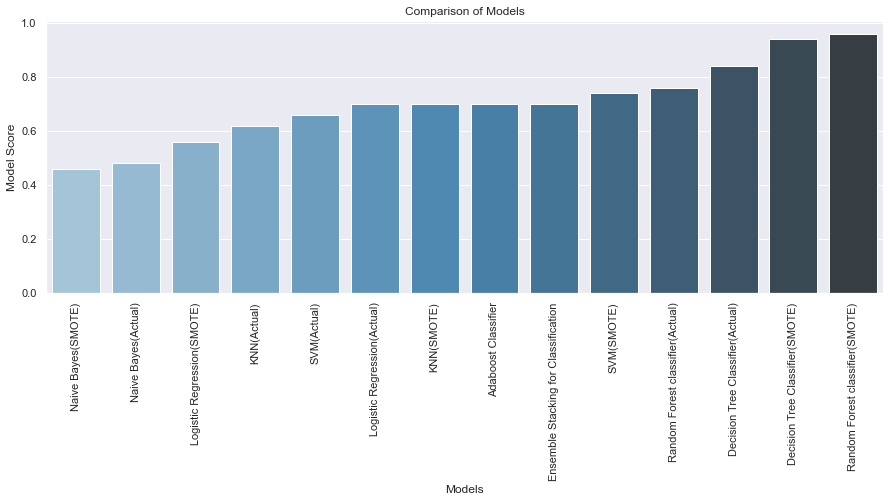

In [195]:
plt.figure(figsize=(15,5))
sns.barplot(x = 'Model',y='Accuracy', data=compare_models, palette=("Blues_d"), order=compare_models.sort_values('Accuracy').Model)
plt.xlabel('Models')
plt.ylabel("Model Score")
plt.title('Comparison of Models')
plt.xticks(rotation=90)
plt.show()

## Check - Prediction Using Random Forest Classifier(SMOTE)

In [196]:
RF_smote = RandomForestClassifier()
RF_smote_model = RF_smote.fit(X_train_smote,y_train_smote)

In [197]:
## Taken data from data set (Example 1)
t = RF_smote.predict([[33, 1, 2, 9,121]])
print(t)

[6]


In [198]:
## Taken data from data set (Example 2)
t = RF_smote.predict([[36, 1, 0, 9,7]])
print(t)

[2]


## Filters

In [199]:
new = df.copy()
new.head()

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp
0,Site Merchandiser,Mahindra First Choice Wheels Ltd (car&bike),"Banners,Content,google analytics,merchandising...",4.1,556,4-5,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-site-merch...,4,5,4.5,1
1,Graphic Designer,Mahindra First Choice Wheels Ltd (car&bike),"Video Editing,Illustrator,Adobe After Effects,...",4.1,556,2-5,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-graphic-de...,2,5,3.5,0
2,Executive Copywriter,Mahindra First Choice Wheels Ltd (car&bike),"Graphics,text images,Content,copy writer,socia...",4.1,556,2-4,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-executive-...,2,4,3.0,0
3,"Automation Test Engineer Position , Bangalore",Mahindra First Choice Wheels Ltd (car&bike),"#Automation Tester,Automation Engineering",4.1,556,3-5,"7,00,000 - 10,00,000 PA.",Bangalore/Bengaluru,8 Days Ago,https://www.naukri.com/job-listings-automation...,3,5,4.0,0
4,Area Manager - Xmart,Mahindra First Choice Wheels Ltd (car&bike),"dealer sales,Channel Sales,Dealer Channel Mana...",4.1,556,3-8,Not disclosed,"Ludhiana, Jaipur, Delhi / NCR",30+ Days Ago,https://www.naukri.com/job-listings-area-manag...,3,8,5.5,1


In [200]:
new['Location1']=new['Location'].apply(preprocess_location1)

In [201]:
new.head(20)

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp,Location1
0,Site Merchandiser,Mahindra First Choice Wheels Ltd (car&bike),"Banners,Content,google analytics,merchandising...",4.1,556,4-5,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-site-merch...,4,5,4.5,1,Mumbai
1,Graphic Designer,Mahindra First Choice Wheels Ltd (car&bike),"Video Editing,Illustrator,Adobe After Effects,...",4.1,556,2-5,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-graphic-de...,2,5,3.5,0,Mumbai
2,Executive Copywriter,Mahindra First Choice Wheels Ltd (car&bike),"Graphics,text images,Content,copy writer,socia...",4.1,556,2-4,Not disclosed,Mumbai,1 Day Ago,https://www.naukri.com/job-listings-executive-...,2,4,3.0,0,Mumbai
3,"Automation Test Engineer Position , Bangalore",Mahindra First Choice Wheels Ltd (car&bike),"#Automation Tester,Automation Engineering",4.1,556,3-5,"7,00,000 - 10,00,000 PA.",Bangalore/Bengaluru,8 Days Ago,https://www.naukri.com/job-listings-automation...,3,5,4.0,0,Bangalore/Bengaluru
4,Area Manager - Xmart,Mahindra First Choice Wheels Ltd (car&bike),"dealer sales,Channel Sales,Dealer Channel Mana...",4.1,556,3-8,Not disclosed,"Ludhiana, Jaipur, Delhi / NCR",30+ Days Ago,https://www.naukri.com/job-listings-area-manag...,3,8,5.5,1,Ludhiana
5,Area Manager - XMart,Mahindra First Choice Wheels Ltd (car&bike),"sales operations,area management,Business Deve...",4.1,556,6-8,Not disclosed,"Guwahati, Bhopal, Raipur",30+ Days Ago,https://www.naukri.com/job-listings-area-manag...,6,8,7.0,1,Guwahati
6,Software Engineer- BIZAGI Developer,Mahindra First Choice Wheels Ltd (car&bike),"MS SQL,Web services,Design development,busines...",4.1,556,3-8,Not disclosed,"Chennai, Bengaluru",30+ Days Ago,https://www.naukri.com/job-listings-software-e...,3,8,5.5,1,Chennai
7,Software Engineer/ Senior Software Engineer,Mahindra First Choice Wheels Ltd (car&bike),"PHP,OOPS,PHP framework,Laravel,React JS,CSS3,S...",4.1,556,2-6,Not disclosed,Bangalore/Bengaluru,25 Days Ago,https://www.naukri.com/job-listings-software-e...,2,6,4.0,0,Bangalore/Bengaluru
8,Store Manager - Superstore,Mahindra First Choice Wheels Ltd (car&bike),"sales,Key Account Management,Business Developm...",4.1,556,8-12,Not disclosed,"Nasik/Nashik, Pune",30+ Days Ago,https://www.naukri.com/job-listings-store-mana...,8,12,10.0,2,Nasik/Nashik
9,Customer Relation Executive,Mahindra First Choice Wheels Ltd (car&bike),"Customer Relation Executive,Malayalam,Customer...",4.1,556,0-2,Not disclosed,Gurgaon,30+ Days Ago,https://www.naukri.com/job-listings-customer-r...,0,2,1.0,0,Gurgaon


In [202]:
job = input("Enter your designation.")
job = str.title(job)
exp = int(input("Enter Experience"))

loc = input("Enter Location")
loc = str.title(loc)

new[(new['Job Post']==job) & (new['Min. Exp.']<=exp) & (new['Location1']==loc)]

Enter your designation.java developer
Enter Experience2
Enter Locationindore


,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp,Location1
192,Java Developer,TATA CONSULTANCY SERVICES (TCS),"java,React,Angular JS,JavaScript,HTML,CSS,Ambe...",3.9,46198,2-7,"5,00,000 - 15,00,000 PA.",Indore,7 Days Ago,https://www.naukri.com/job-listings-java-devel...,2,7,4.5,1,Indore
283,Java Developer,TATA CONSULTANCY SERVICES (TCS),"java,React,JavaScript,HTML,Angular JS,Amber,CS...",3.9,46198,2-7,"5,00,000 - 15,00,000 PA.",Indore,28 Days Ago,https://www.naukri.com/job-listings-java-devel...,2,7,4.5,1,Indore


In [203]:
#exp = int(input("Enter Experience"))
#display(new[new['Min. Exp.']<=exp])

In [204]:
new[new['Job Post']=="Java Developer"]

,Job Post,Company,Skills,Ratings,Reviews,Experience(in Yrs),Salary,Location,Job_Post_History,URL,Min. Exp.,Max. Exp.,Avg Exp.,BinnedExp,Location1
192,Java Developer,TATA CONSULTANCY SERVICES (TCS),"java,React,Angular JS,JavaScript,HTML,CSS,Ambe...",3.9,46198,2-7,"5,00,000 - 15,00,000 PA.",Indore,7 Days Ago,https://www.naukri.com/job-listings-java-devel...,2,7,4.5,1,Indore
233,Java Developer,TATA CONSULTANCY SERVICES (TCS),"Java,Spring Boot,troubleshooting,Linux,IT Skil...",3.9,46198,3-8,Not disclosed,"Hyderabad/Secunderabad, Bangalore/Bengaluru",1 Day Ago,https://www.naukri.com/job-listings-java-devel...,3,8,5.5,1,Hyderabad/Secunderabad
275,Java Developer,TATA CONSULTANCY SERVICES (TCS),"Spring boot,Java,Microservices,troubleshooting...",3.9,46198,3-8,Not disclosed,"Hyderabad/Secunderabad, Pune, Bangalore/Bengaluru",8 Days Ago,https://www.naukri.com/job-listings-java-devel...,3,8,5.5,1,Hyderabad/Secunderabad
283,Java Developer,TATA CONSULTANCY SERVICES (TCS),"java,React,JavaScript,HTML,Angular JS,Amber,CS...",3.9,46198,2-7,"5,00,000 - 15,00,000 PA.",Indore,28 Days Ago,https://www.naukri.com/job-listings-java-devel...,2,7,4.5,1,Indore
285,Java Developer,TATA CONSULTANCY SERVICES (TCS),"java,Javascript,microservices,J2EE,Spring boot...",3.9,46198,2-7,Not disclosed,Delhi / NCR,28 Days Ago,https://www.naukri.com/job-listings-java-devel...,2,7,4.5,1,Delhi / NCR
394,Java Developer,TATA CONSULTANCY SERVICES (TCS),"Java,IT Skills",3.9,46198,4-9,Not disclosed,"Kolkata, Hyderabad/Secunderabad, Pune, Ahmedab...",19 Days Ago,https://www.naukri.com/job-listings-java-devel...,4,9,6.5,1,Kolkata
443,Java Developer,TATA CONSULTANCY SERVICES (TCS),"java,IT Skills",3.9,46198,3-7,Not disclosed,Chennai,14 Days Ago,https://www.naukri.com/job-listings-java-devel...,3,7,5.0,1,Chennai
612,Java Developer,TATA CONSULTANCY SERVICES (TCS),"Java,Hibernate,Spring,JPA2,Springboot Framewor...",3.9,46198,4-6,Not disclosed,Bangalore/Bengaluru,25 Days Ago,https://www.naukri.com/job-listings-java-devel...,4,6,5.0,1,Bangalore/Bengaluru
666,Java Developer,TATA CONSULTANCY SERVICES (TCS),"Spring,Java,J2EE,microservices,Springboot,IT S...",3.9,46198,3-8,Not disclosed,"Hyderabad/Secunderabad, Chennai, Bangalore/Ben...",20 Days Ago,https://www.naukri.com/job-listings-java-devel...,3,8,5.5,1,Hyderabad/Secunderabad
723,Java Developer,TATA CONSULTANCY SERVICES (TCS),"Java,Spring,springboot,Microservices,IT Skills",3.9,46198,4-8,Not disclosed,Chennai,30+ Days Ago,https://www.naukri.com/job-listings-java-devel...,4,8,6.0,1,Chennai


In [205]:
#xyz = df[(df['Job Post']=="Java Developer") | (df['Experience(in Yrs)']=="2-7")]
#xyz

In [206]:
#if any("Kolkata" in word for word in df['Location'].str.split(",")):
    #display(df[df['Location']=="Kolkata"])


In [207]:
s = "java developer"
print("Original string:")
print(s)
print("After capitalizing first letter:")
print(s.capitalize())

Original string:
java developer
After capitalizing first letter:
Java developer


In [208]:
s = "pune"
print("Original string:")
print(s)
print("After capitalizing first letter:")
print(str.title(s))

Original string:
pune
After capitalizing first letter:
Pune


In [209]:
 df.loc[df['Job Post'] == 'Java Developer', 'Experience(in Yrs)']

192      2-7  
233      3-8  
275      3-8  
283      2-7  
285      2-7  
394      4-9  
443      3-7  
612      4-6  
666      3-8  
723      4-8  
765     8-13  
795      3-8  
837      6-9  
840     5-10  
1224     4-7  
2578     4-8  
2625     2-5  
2893     4-8  
3028     2-3  
3701     3-6  
Name: Experience(in Yrs), dtype: object

In [210]:
 df.loc[df['Job Post'] == 'Java Developer', 'Location']

192                                                Indore
233           Hyderabad/Secunderabad, Bangalore/Bengaluru
275     Hyderabad/Secunderabad, Pune, Bangalore/Bengaluru
283                                                Indore
285                                           Delhi / NCR
394     Kolkata, Hyderabad/Secunderabad, Pune, Ahmedab...
443                                               Chennai
612                                   Bangalore/Bengaluru
666     Hyderabad/Secunderabad, Chennai, Bangalore/Ben...
723                                               Chennai
765     Hyderabad/Secunderabad, Pune, Bangalore/Bengaluru
795                                                 India
837                    Pune, Chennai, Bangalore/Bengaluru
840                                   Bangalore/Bengaluru
1224                                              Chennai
2578                                                 Pune
2625                                              Chennai
2893          

In [211]:
df.loc[df['Job Post'] == 'Dot Net Developer', 'Experience(in Yrs)']

19      5-10  
193      2-7  
282      2-7  
386      4-9  
842     8-10  
1422     3-8  
2263     4-8  
2776     3-8  
3709     2-4  
3772     3-8  
Name: Experience(in Yrs), dtype: object